### Import Libraries

In [1]:
# Importing Libraries and Data
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from tqdm import tqdm
# import fid
import tensorflow as tf
from keras import backend as K
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy import asarray
from numpy.random import randint
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from skimage.transform import resize
from keras.datasets import cifar10 #Data
from keras.models import Sequential, Model
from keras.layers import Input, Dense, LeakyReLU, BatchNormalization
from keras.layers import Conv2D, Conv2DTranspose, Reshape, Flatten
from keras.optimizers import Adam
from keras import initializers
from keras.utils import plot_model, np_utils

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

## Load and Prepare the dataset

Training images shape:  (50000, 32, 32, 3)
Number of training samples  50000
Number of testing samples  10000


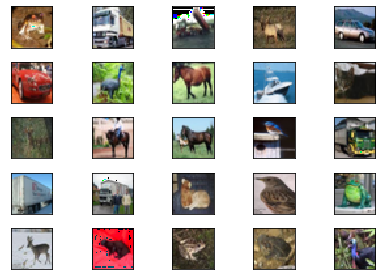

In [34]:
# Load the cifar10 dataset
(train_images, train_labels), (test_images, test_labels) = cifar10.load_data()

print('Training images shape: ', train_images.shape)
print('Number of training samples ', train_images.shape[0])
print('Number of testing samples ', test_images.shape[0])

# Plotting some training images
for i in range(25):
    plt.subplot(5,5, i+1, xticks = [], yticks = [])
    plt.imshow(train_images[i] + 1)
plt.tight_layout()
plt.show()

# Normalize the images to [-1, 1]
train_images = (train_images - 127.5) / 127.5
test_images= (test_images - 127.5) / 127.5

## Implementing the model

### The Generator part of DCGAN

In [3]:
def make_generator_model():
    model = Sequential()

    # Dense layer
    model.add(Dense(2*2*512, input_shape = (100,), use_bias=False, kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02, seed=123))) #
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.3)) #default is 0.3

    model.add(Reshape((2,2,512)))

    # CONV 1: 4x4x256
    model.add(Conv2DTranspose(256, kernel_size=5, strides=2, padding='same', use_bias=False))
    model.add(BatchNormalization())
    model.add(LeakyReLU(0.3))

    #  CONV 2: 8x8x128
    model.add(Conv2DTranspose(128, kernel_size=5, strides=2, padding='same', use_bias=False))
    model.add(BatchNormalization())
    model.add(LeakyReLU(0.3))

    # CONV 3: 16x16x64
    model.add(Conv2DTranspose(64, kernel_size=5, strides=2, padding='same', use_bias=False))
    model.add(BatchNormalization())
    model.add(LeakyReLU(0.3))

    # CONV 4: 32x32x3
    model.add(Conv2DTranspose(3, kernel_size=5, strides=2, padding='same', activation='tanh', use_bias=False))

    return model


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 2048)              204800    
_________________________________________________________________
batch_normalization_1 (Batch (None, 2048)              8192      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 2048)              0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 2, 2, 512)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 4, 4, 256)         3276800   
_________________________________________________________________
batch_normalization_2 (Batch (None, 4, 4, 256)         1024      
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 4, 4, 256)       

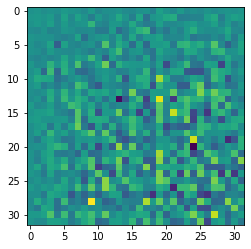

In [4]:
generator = make_generator_model()

noise = np.random.normal(loc=0, scale=1, size=(1, 100))
generated_image = generator.predict(noise)
 
plt.imshow(generated_image[0, :, :, 0])
# Print summary of the model
generator.summary()

### The Discriminator

In [5]:
def make_discriminator_model():
    model = Sequential()

    # CONV 1: 16x16x64
    model.add(Conv2D(64, kernel_size=5, strides=2, padding='same', kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.05, seed=123), 
                     input_shape=[32, 32, 3]))
    model.add(LeakyReLU(0.3))

    # CONV 2: 8x8x128
    model.add(Conv2D(128, kernel_size=5, strides=2, padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(0.3))

    # CONV 3: 4x4x256
    model.add(Conv2D(256, kernel_size=5, strides=2, padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(0.3))

    # CONV 4: 2x2x512
    model.add(Conv2D(512, kernel_size=5, strides=2, padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(0.3))

    # Fully Connected
    model.add(Flatten())

    # Classification
    model.add(Dense(1, activation='sigmoid'))

    return model

In [6]:
discriminator = make_discriminator_model()

decision = discriminator.predict(generated_image)
print('Output of Untrained discriminator: ', decision, '\n')

# Print Summary of the discriminator 
discriminator.summary()

Output of Untrained discriminator:  [[0.50029016]] 

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
batch_normalization_5 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 4, 4, 256)         819456    
_________________________________________________________________
b

# Optimizers

In [7]:
# Discriminator
discriminator.compile(Adam(lr = 0.0002, beta_1=0.5), loss='binary_crossentropy', metrics=['binary_accuracy'])

# GAN
# gan.compile(Adam(lr=0.0002, beta_1=0.5), loss='binary_crossentropy', metrics=['binary_accuracy'])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


### GAN creation

In [8]:
discriminator.trainable=False

inputs = Input(shape=(100,))
generated_image = generator(inputs)
decision = discriminator(generated_image)
gan = Model(inputs=inputs, outputs=decision)

gan.summary()

# GAN
gan.compile(Adam(lr=0.0002, beta_1=0.5), loss='binary_crossentropy', metrics=['binary_accuracy'])

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 100)               0         
_________________________________________________________________
sequential_1 (Sequential)    (None, 32, 32, 3)         4520384   
_________________________________________________________________
sequential_2 (Sequential)    (None, 1)                 4312193   
Total params: 8,832,577
Trainable params: 4,515,392
Non-trainable params: 4,317,185
_________________________________________________________________


# Training

In [9]:
def plot_generated_images(generated_images, epoch):    
    plt.figure(figsize=(5,5), num=2)
    gs1 = gridspec.GridSpec(5,5)
    gs1.update(wspace = 0, hspace = 0)

    for i in range(25):
        ax1 = plt.subplot(gs1[i])
        ax1.set_aspect('equal')
        image = generated_images[i, :, :, :]
        image += 1
        image *= 127.5
        fig = plt.imshow(image.astype(np.uint8))
        plt.axis('off')
        fig.axes.get_xaxis().set_visible(False)
        fig.axes.get_yaxis().set_visible(False)
    plt.savefig('deep-learning-dcgan/save-images/dcgan_generated_image_%d.png' % epoch)
    plt.tight_layout()
    plt.show()

#saving the model weights
def saveModels(epoch,generator,discriminator):
    generator.save_weights('deep-learning-dcgan/save-models/dcgan_generator_epoch_%d.h5' % epoch)
    discriminator.save_weights('deep-learning-dcgan/save-models/dcgan_discriminator_epoch_%d.h5' % epoch)
    gan.save_weights('deep-learning-dcgan/save-models/dcgan_gan_epoch_%d.h5' % epoch)


100%|██████████| 97/97 [00:51<00:00,  1.90it/s]


Epochs: 0/300 , D_Losses: 0.061 , G_Losses:  0.533


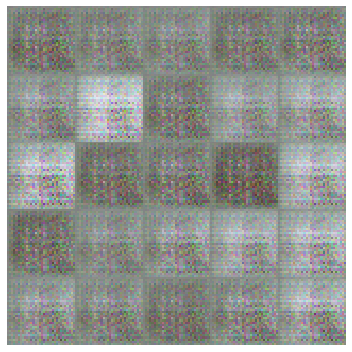

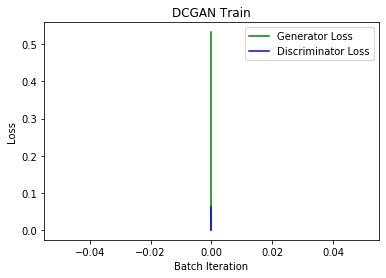

100%|██████████| 97/97 [00:49<00:00,  1.96it/s]


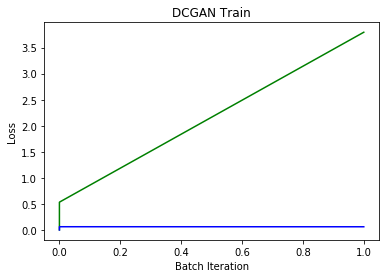

100%|██████████| 97/97 [00:52<00:00,  1.83it/s]


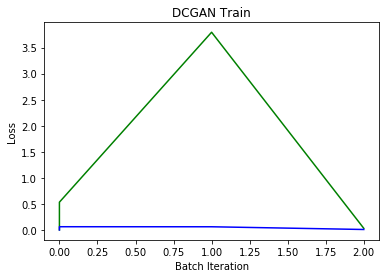

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


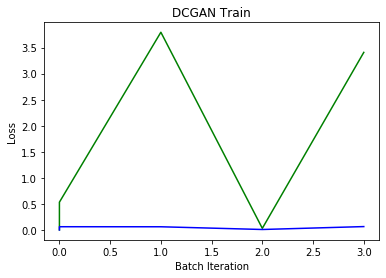

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


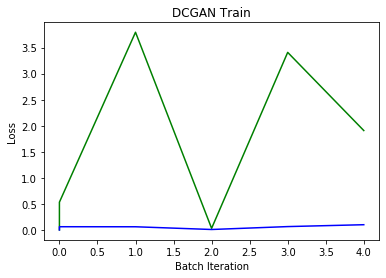

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


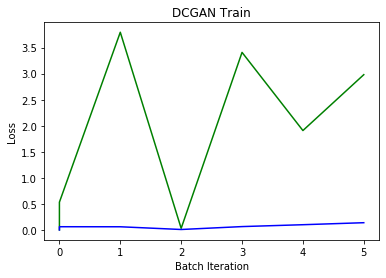

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


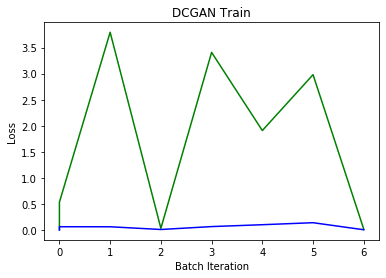

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


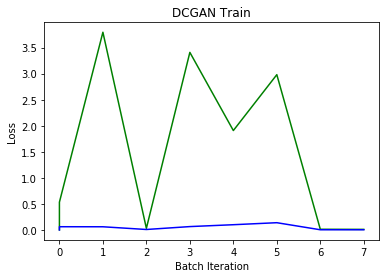

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


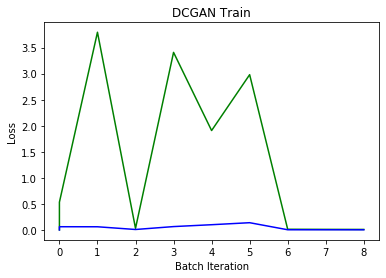

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


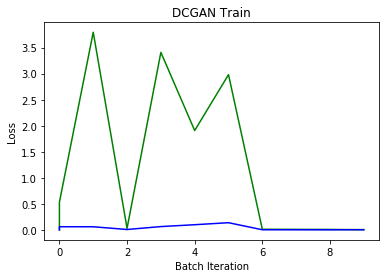

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


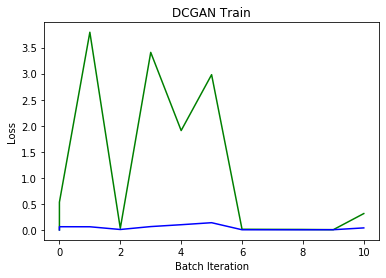

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


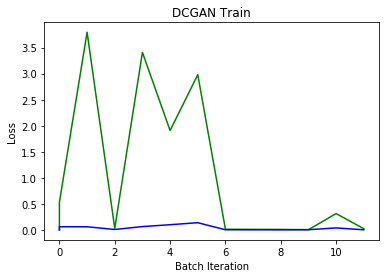

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


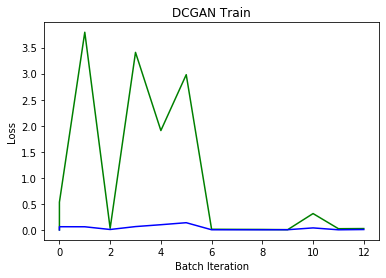

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


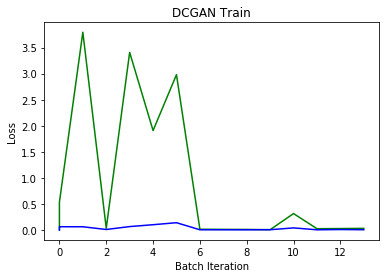

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


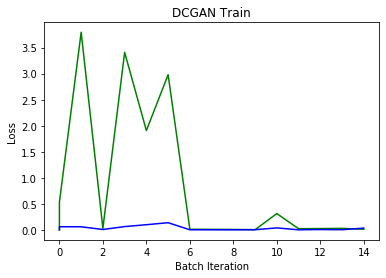

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


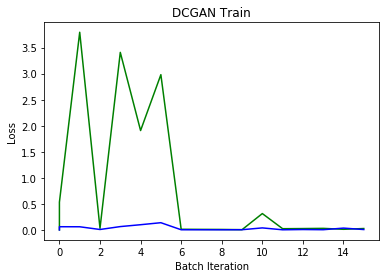

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


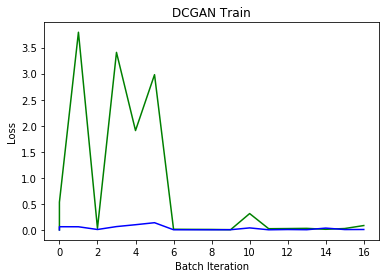

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


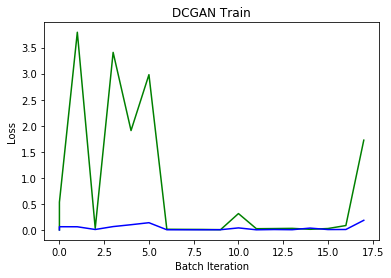

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


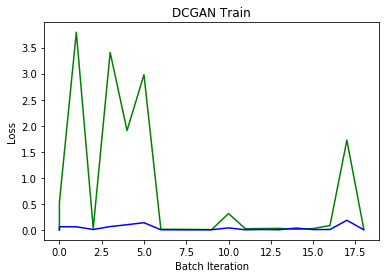

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


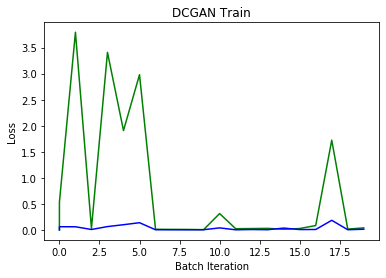

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


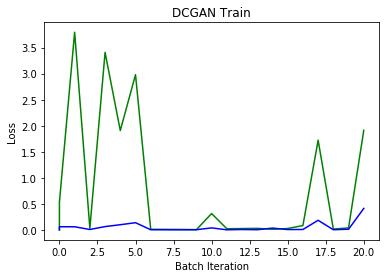

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


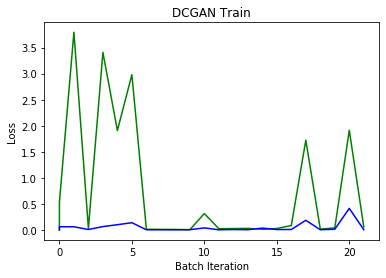

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


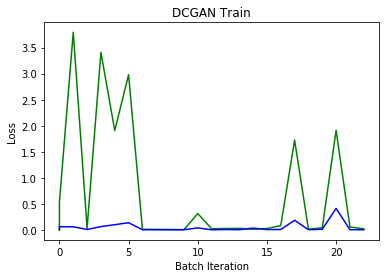

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


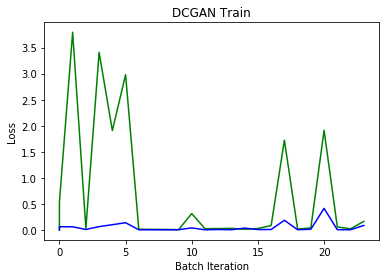

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


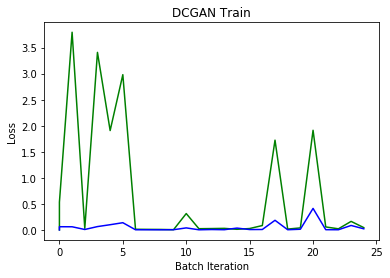

100%|██████████| 97/97 [00:53<00:00,  1.83it/s]


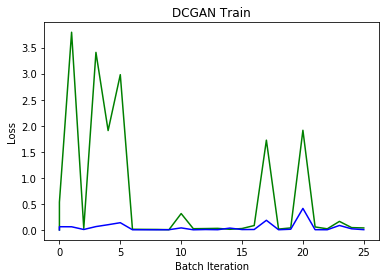

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


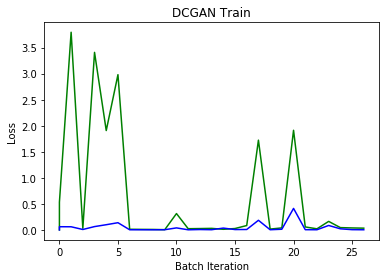

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


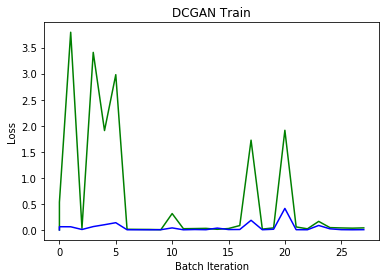

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


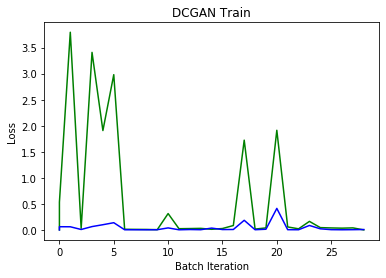

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


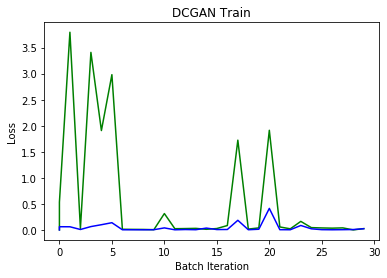

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


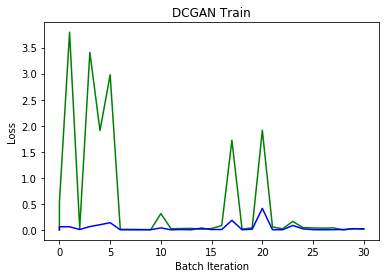

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


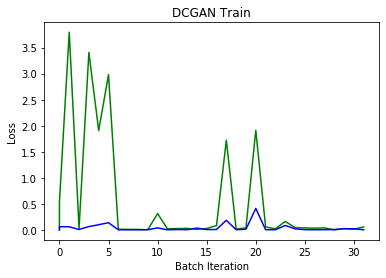

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


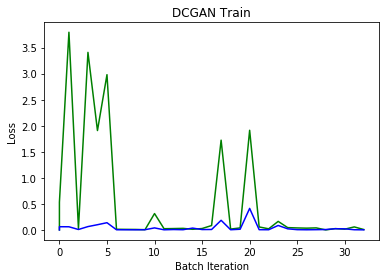

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


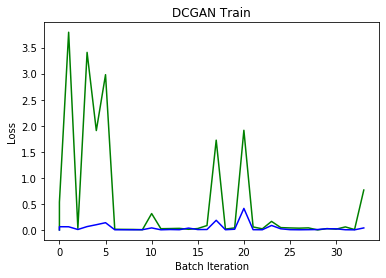

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


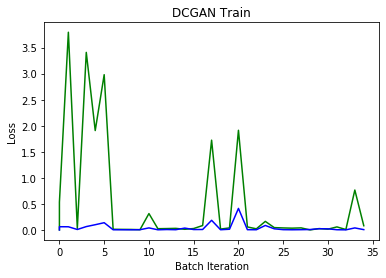

100%|██████████| 97/97 [00:53<00:00,  1.83it/s]


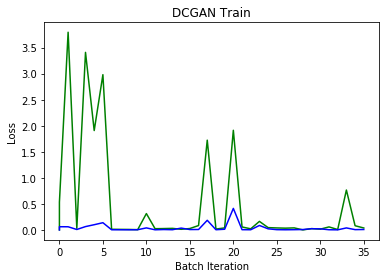

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


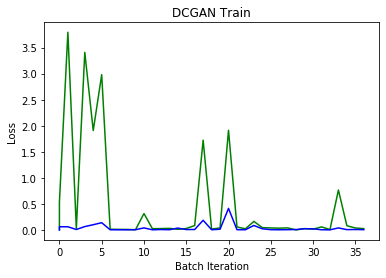

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


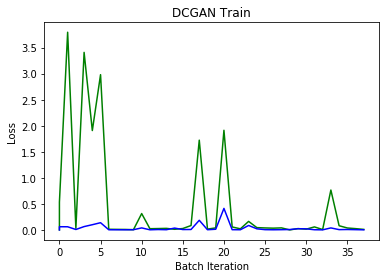

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


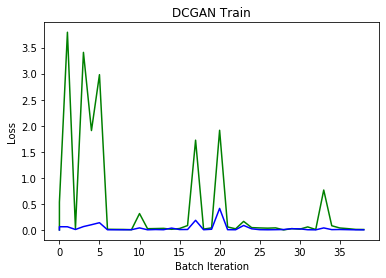

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


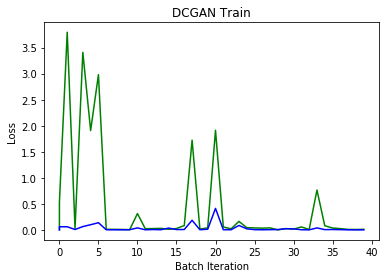

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


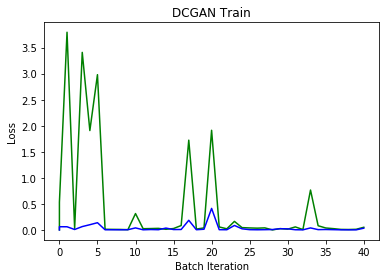

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


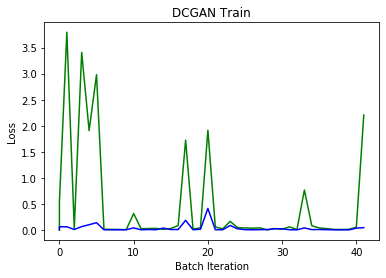

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


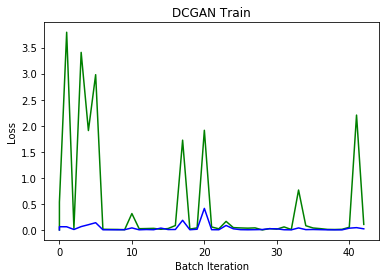

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


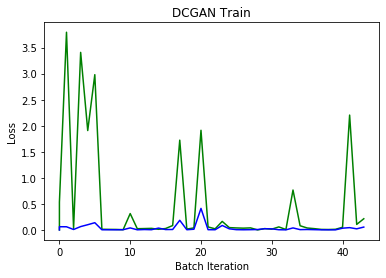

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


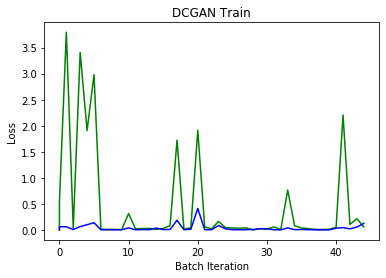

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


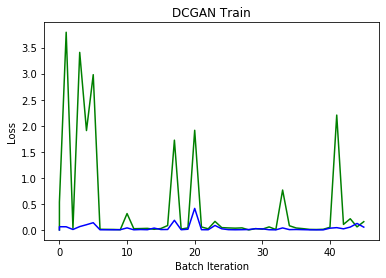

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


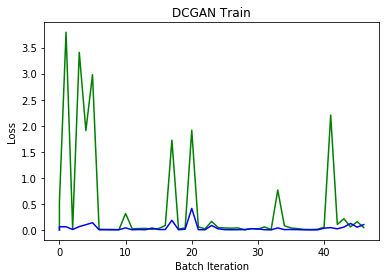

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


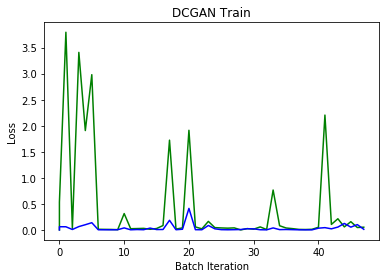

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


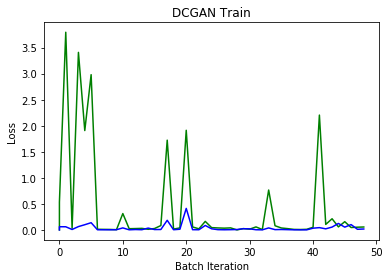

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


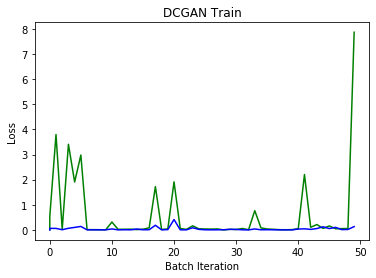

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


Epochs: 50/300 , D_Losses: 0.075 , G_Losses:  2.807


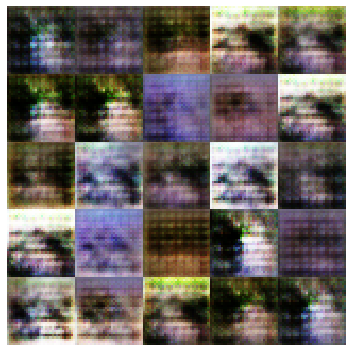

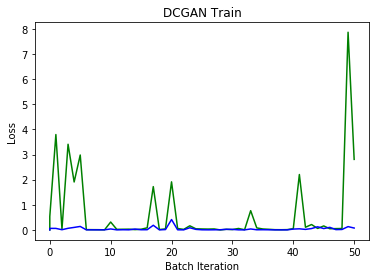

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


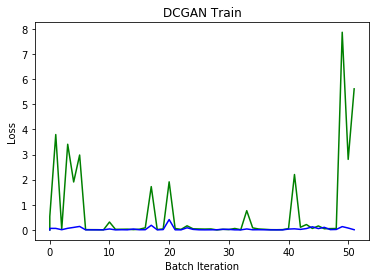

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


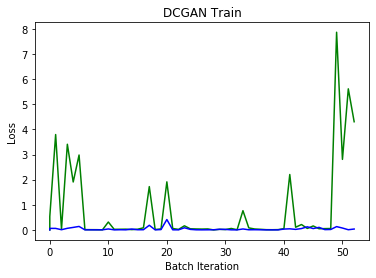

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


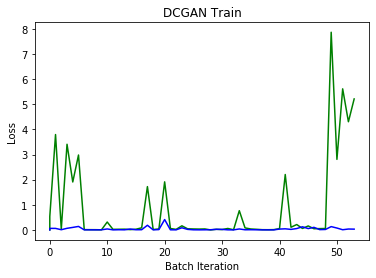

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


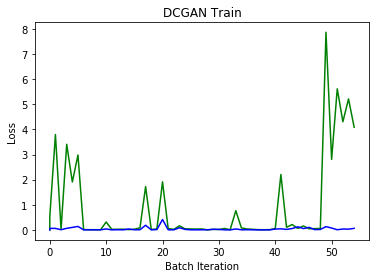

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


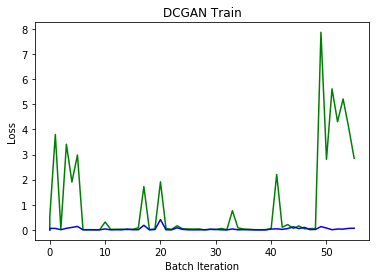

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


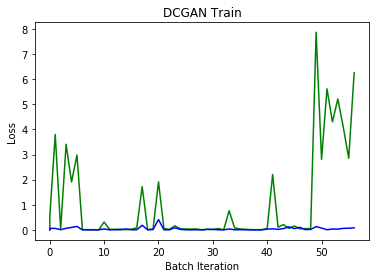

100%|██████████| 97/97 [00:53<00:00,  1.83it/s]


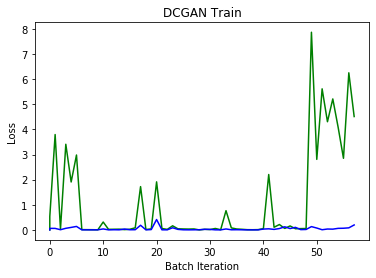

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


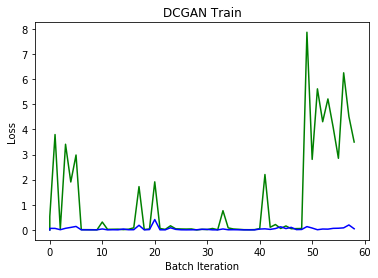

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


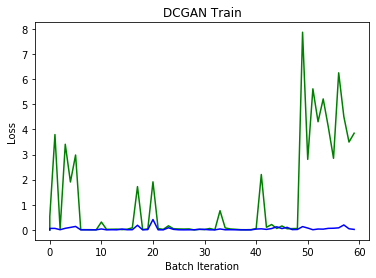

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


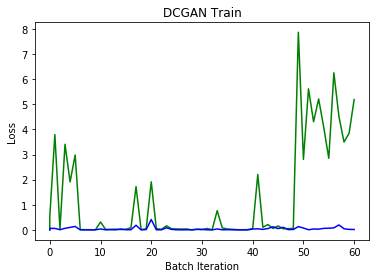

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


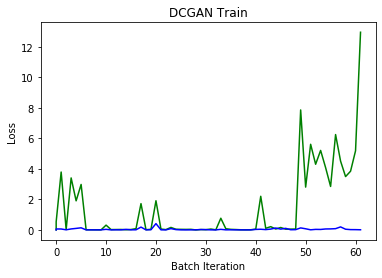

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


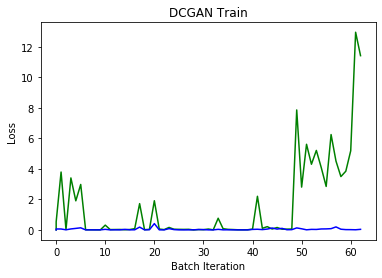

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


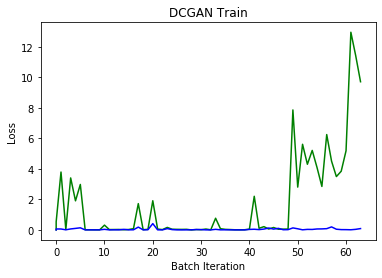

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


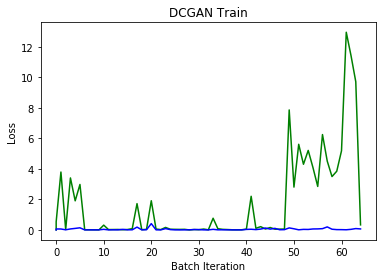

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


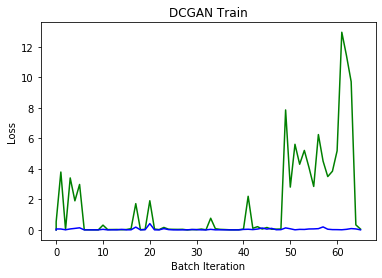

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


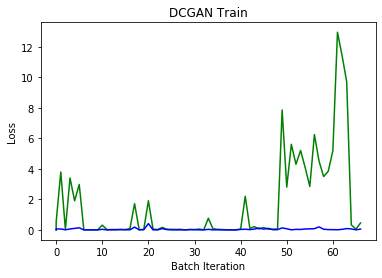

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


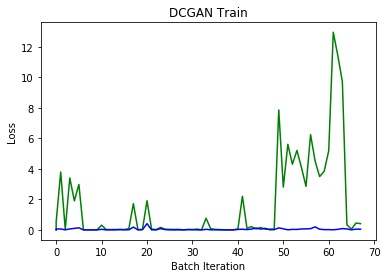

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


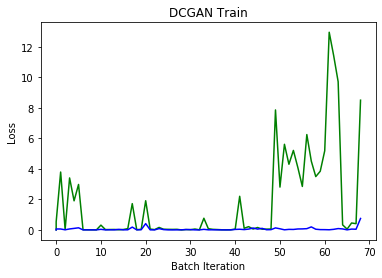

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


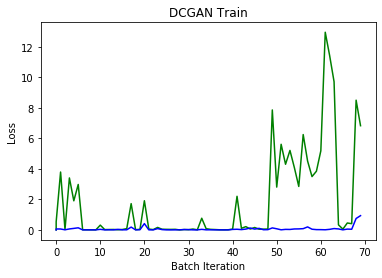

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


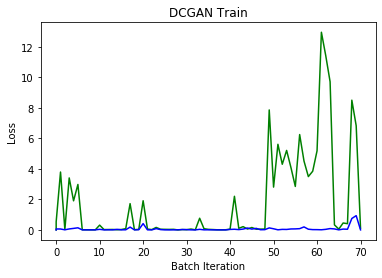

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


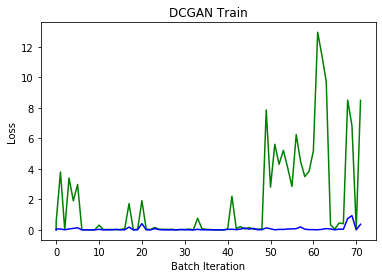

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


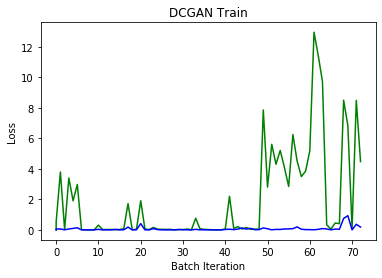

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


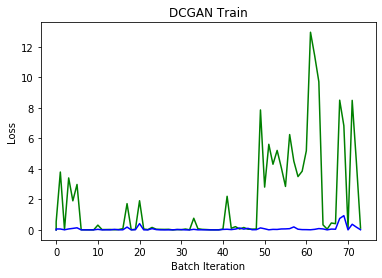

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


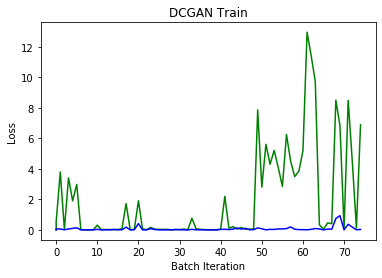

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


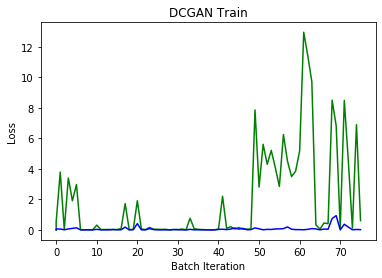

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


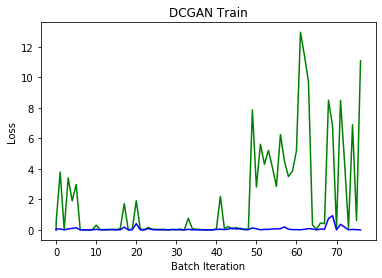

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


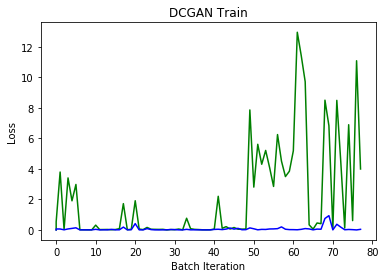

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


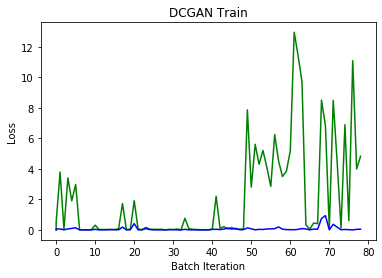

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


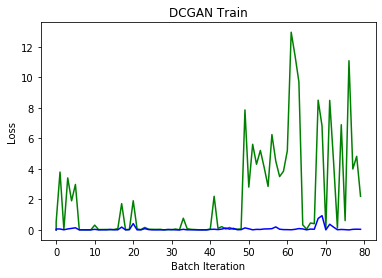

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


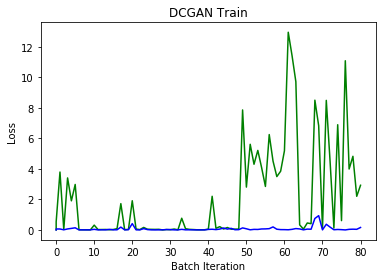

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


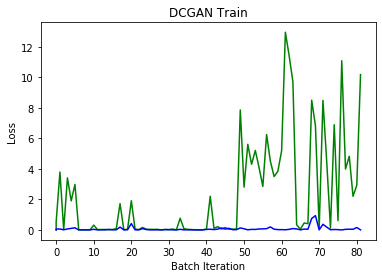

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


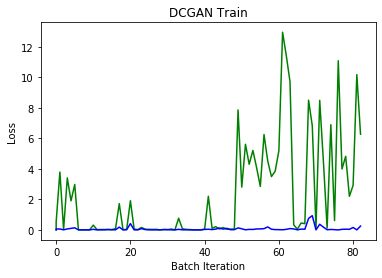

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


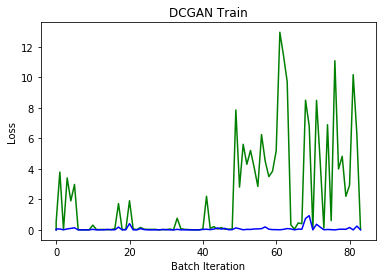

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


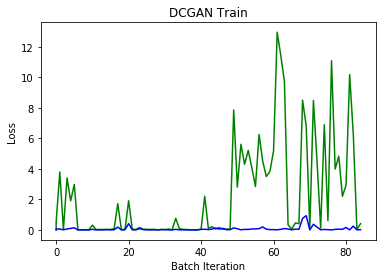

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


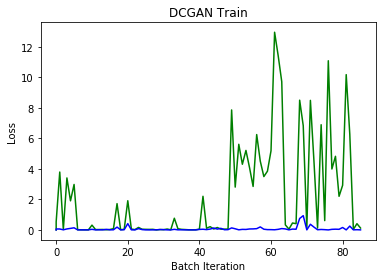

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


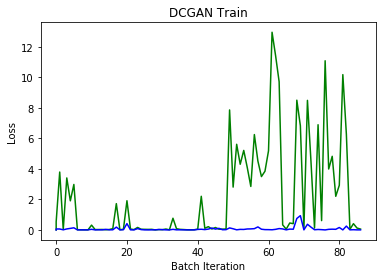

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


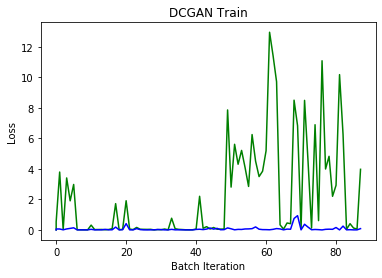

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


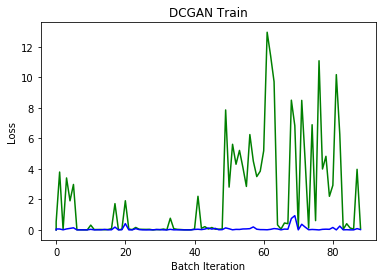

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


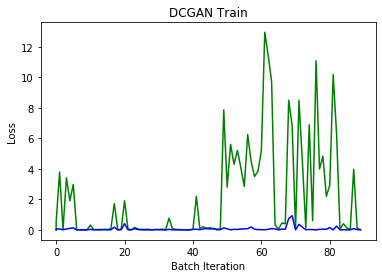

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


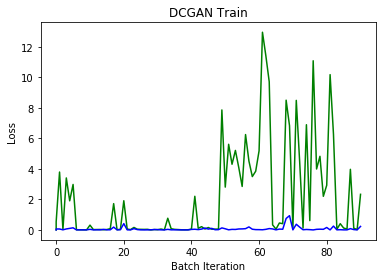

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


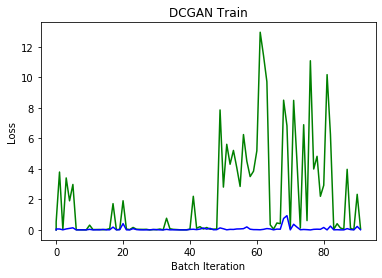

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


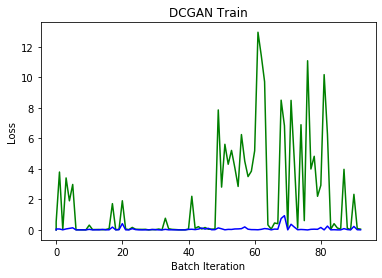

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


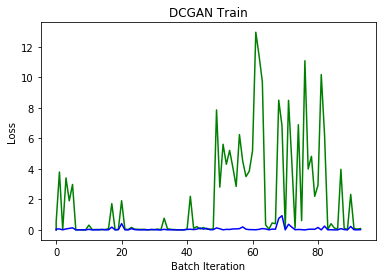

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


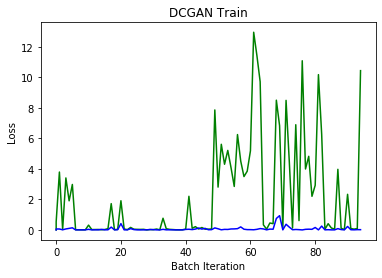

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


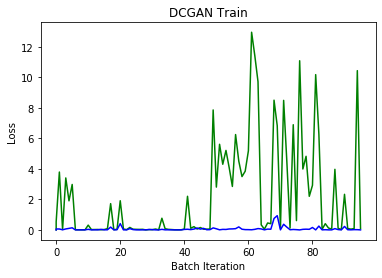

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


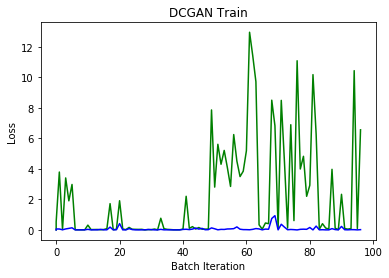

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


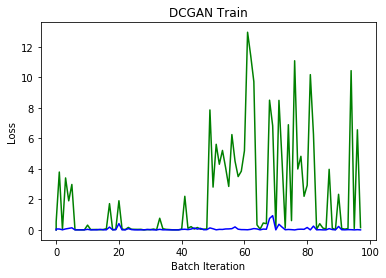

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


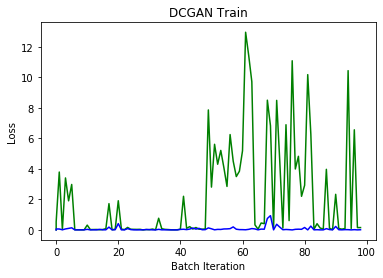

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


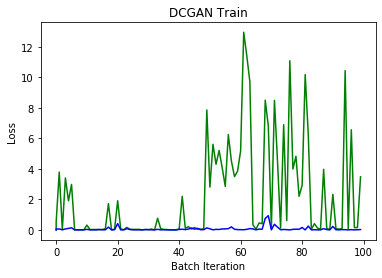

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


Epochs: 100/300 , D_Losses: 0.057 , G_Losses:  0.297


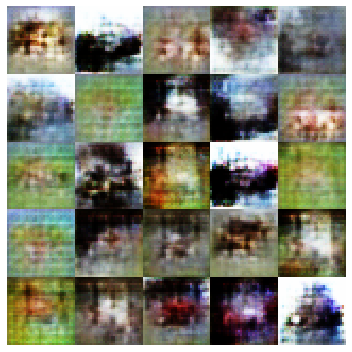

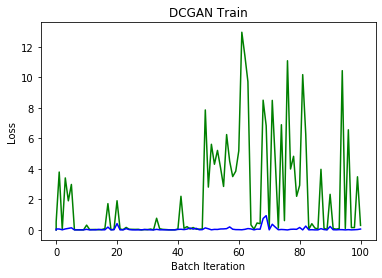

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


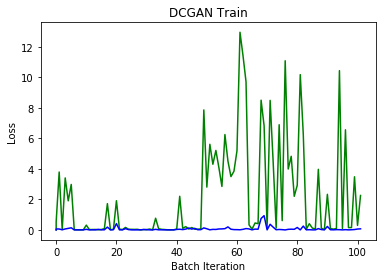

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


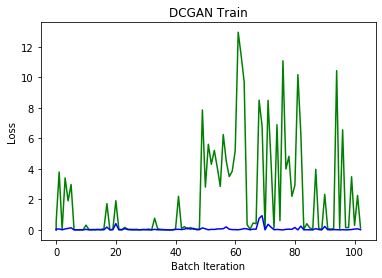

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


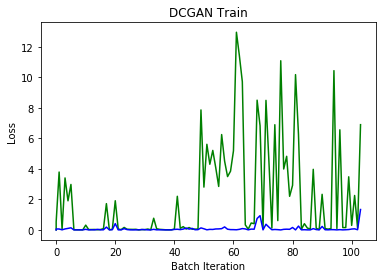

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


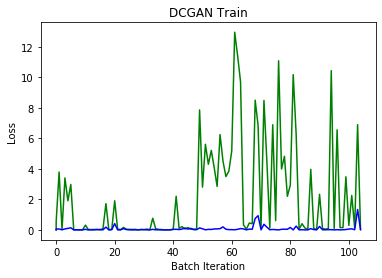

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


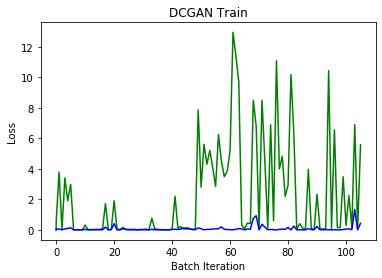

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


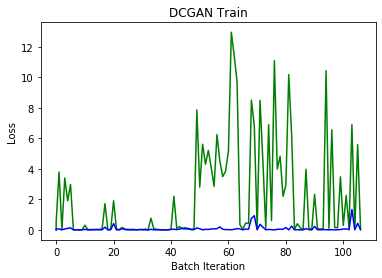

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


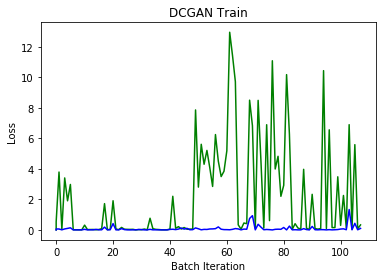

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


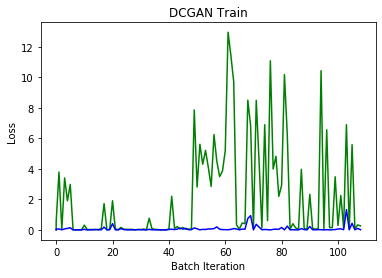

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


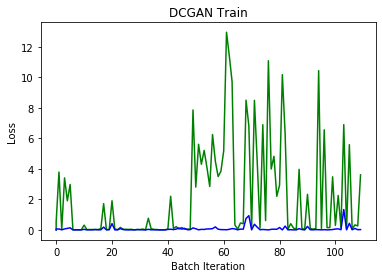

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


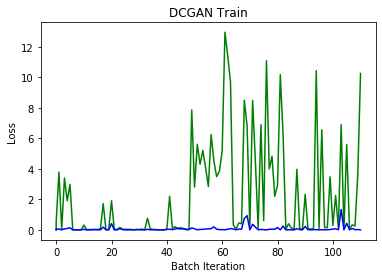

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


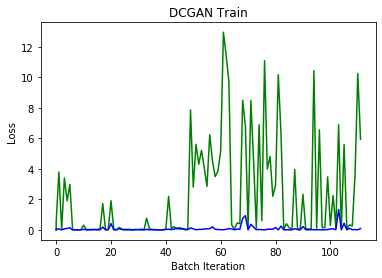

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


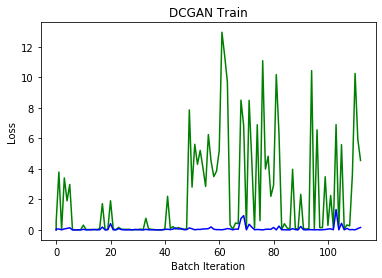

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


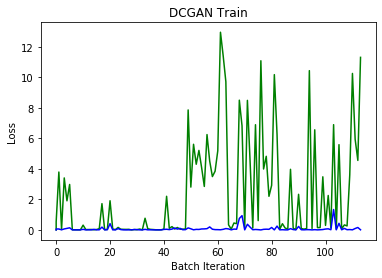

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


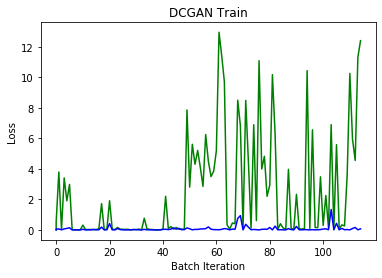

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


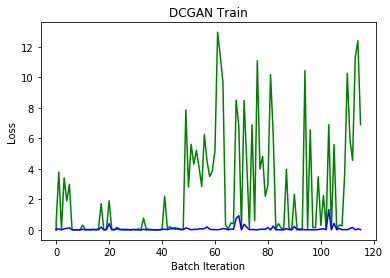

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


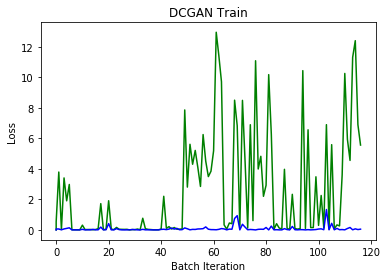

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


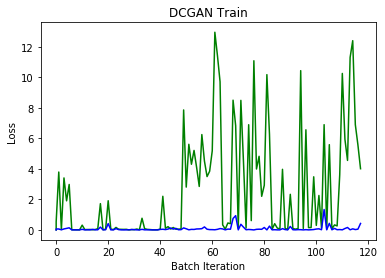

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


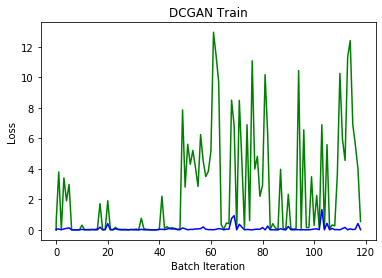

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


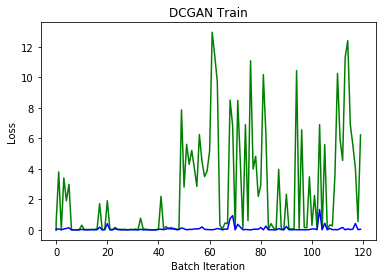

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


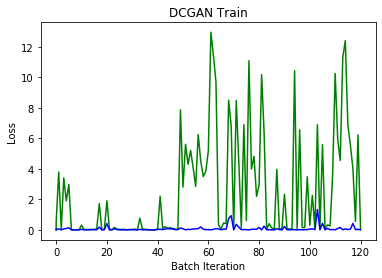

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


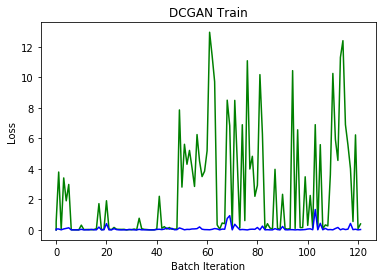

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


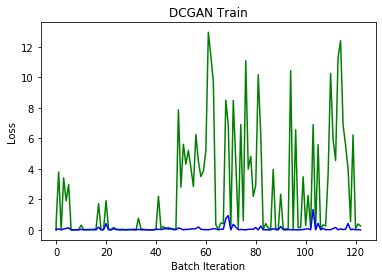

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


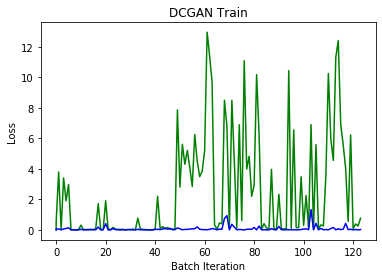

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


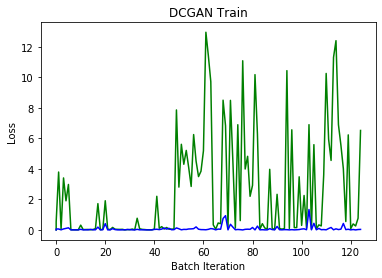

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


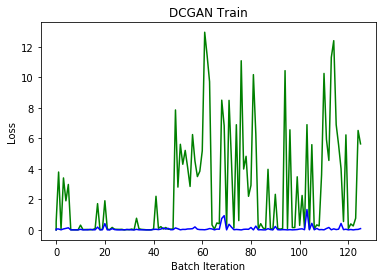

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


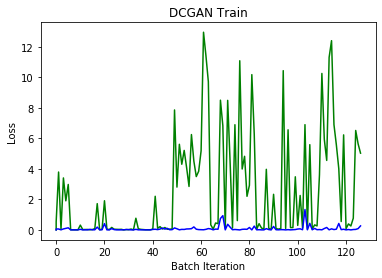

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


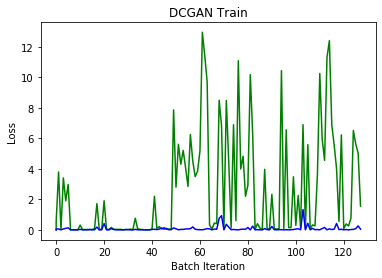

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


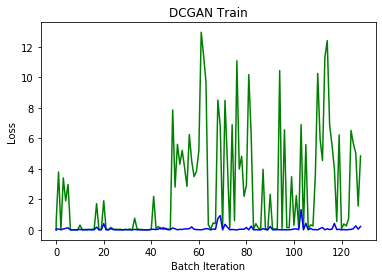

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


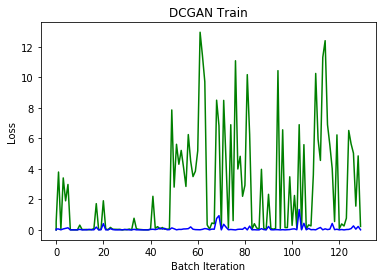

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


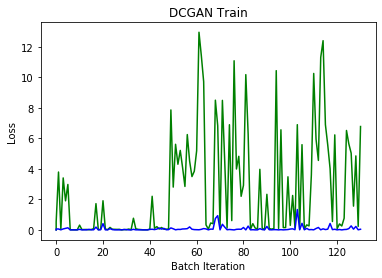

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


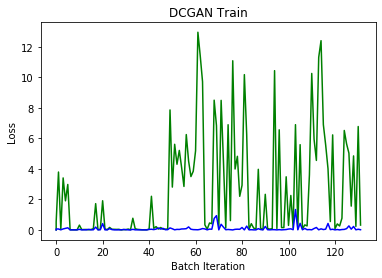

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


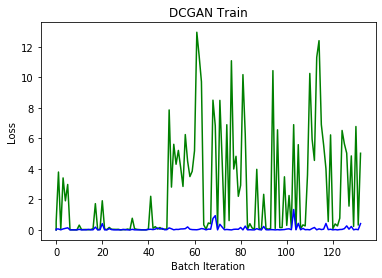

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


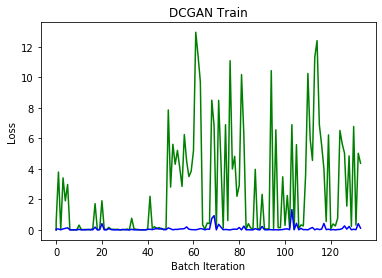

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


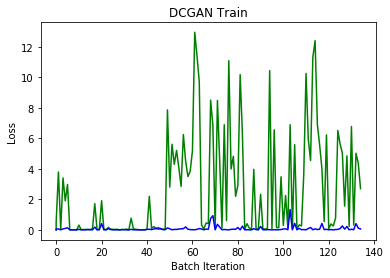

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


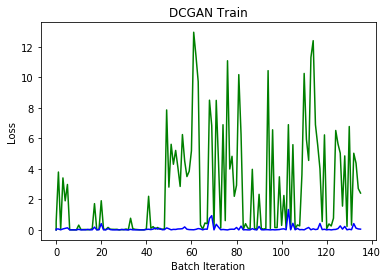

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


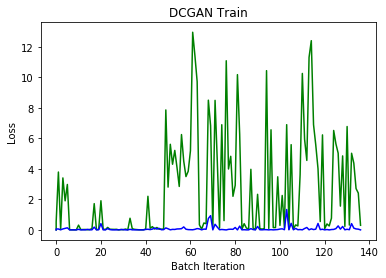

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


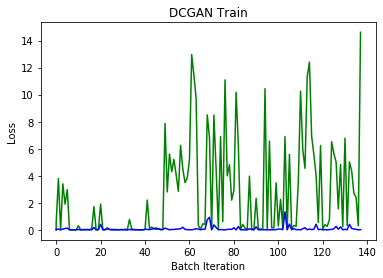

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


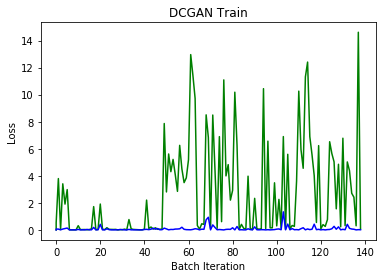

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


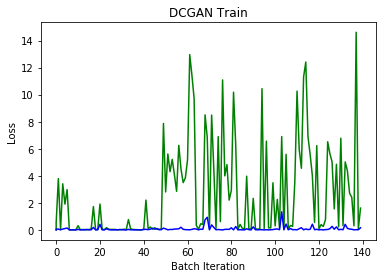

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


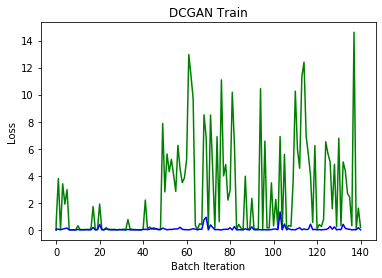

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


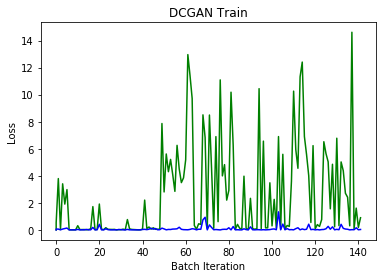

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


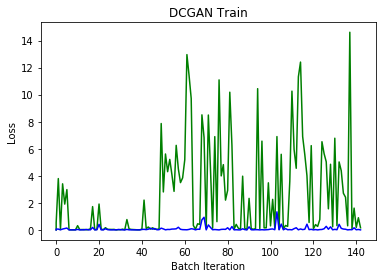

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


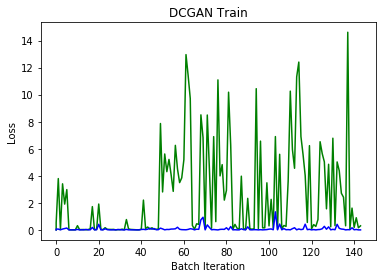

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


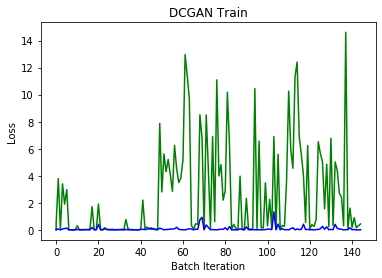

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


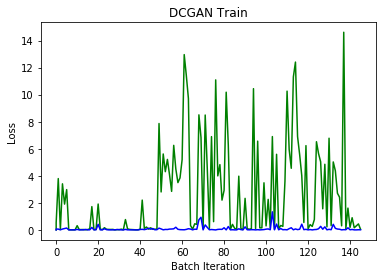

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


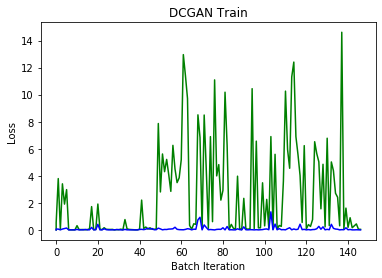

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


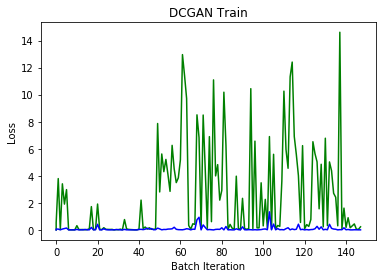

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


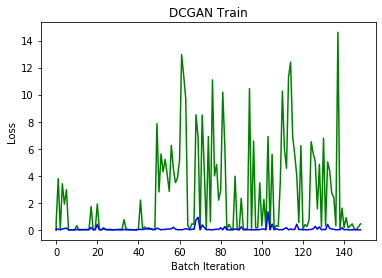

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


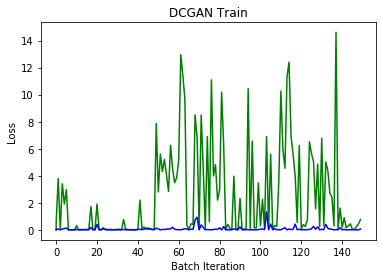

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


Epochs: 150/300 , D_Losses: 0.003 , G_Losses:  14.396


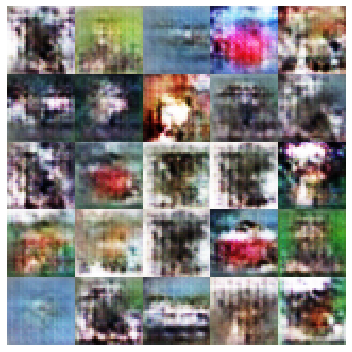

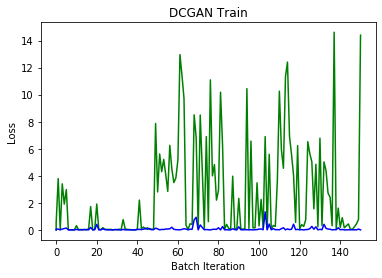

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


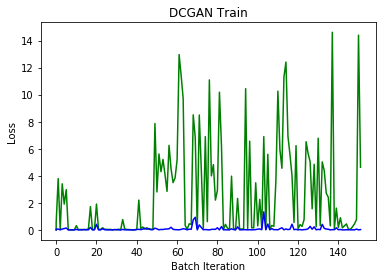

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


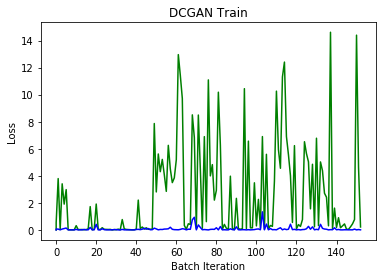

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


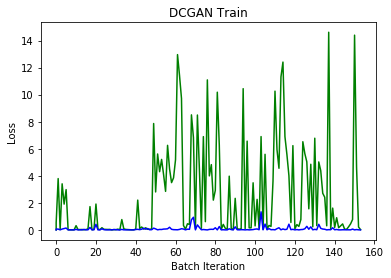

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


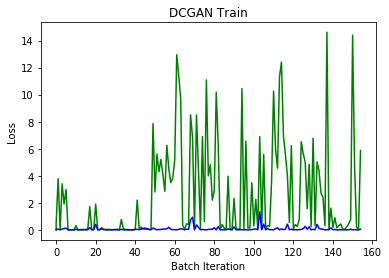

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


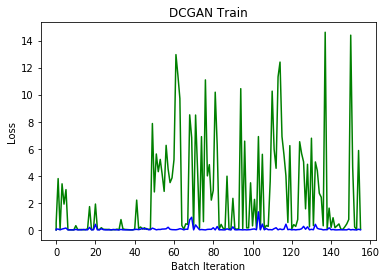

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


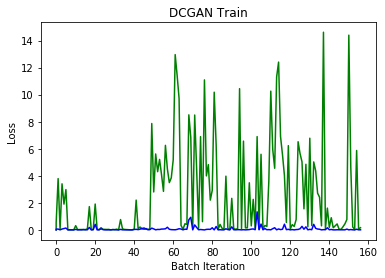

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


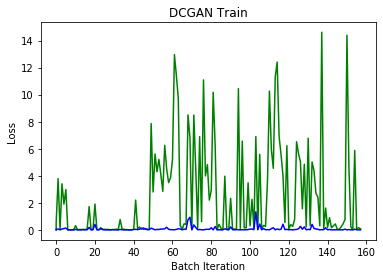

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


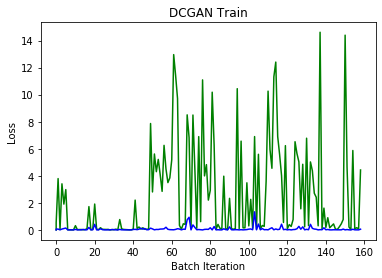

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


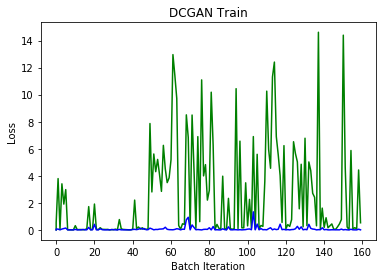

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


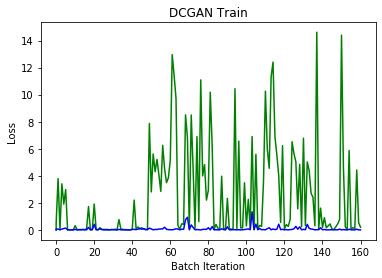

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


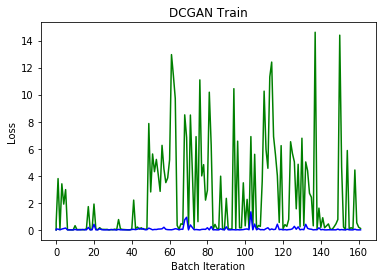

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


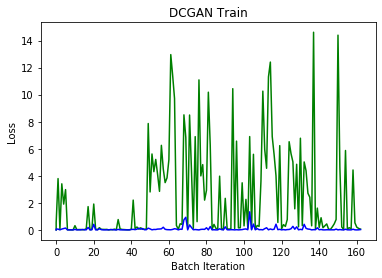

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


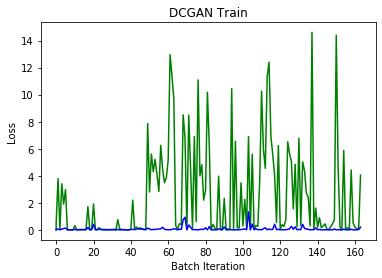

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


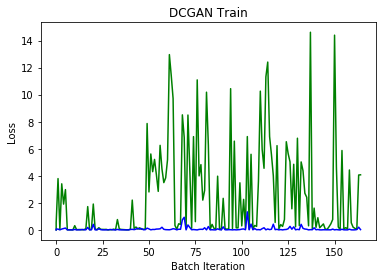

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


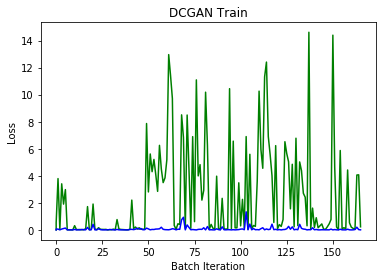

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


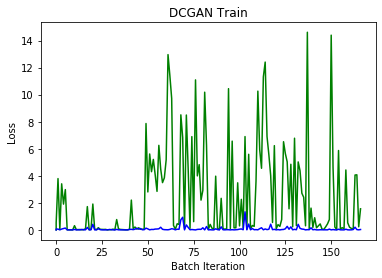

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


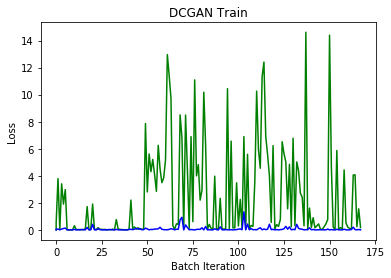

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


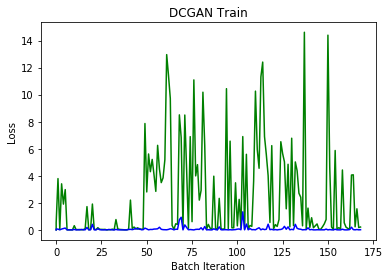

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


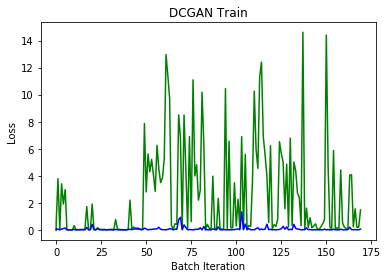

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


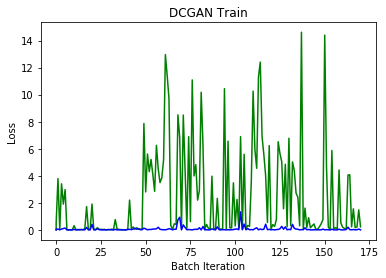

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


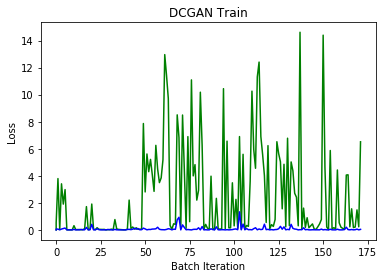

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


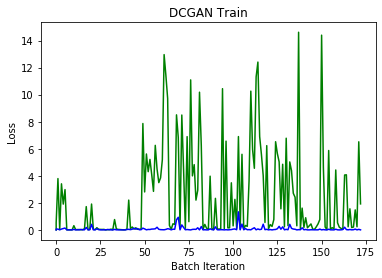

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


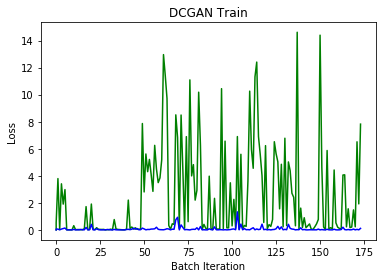

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


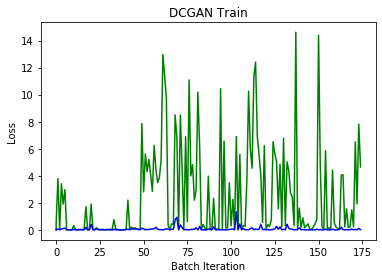

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


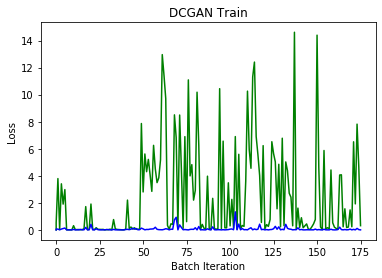

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


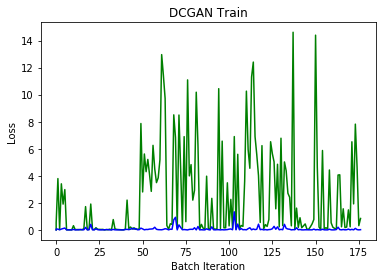

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


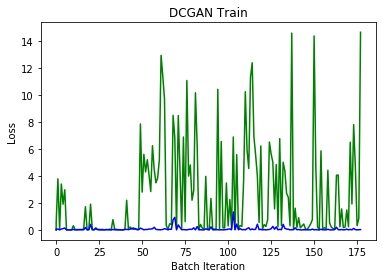

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


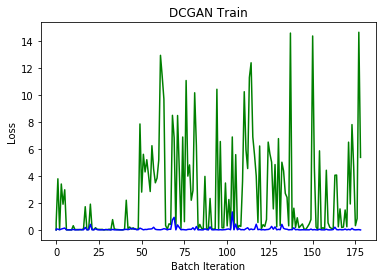

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


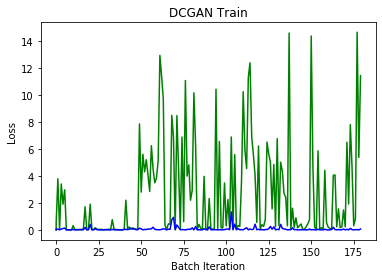

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


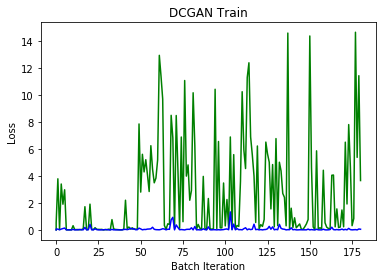

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


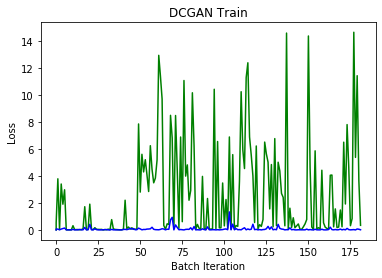

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


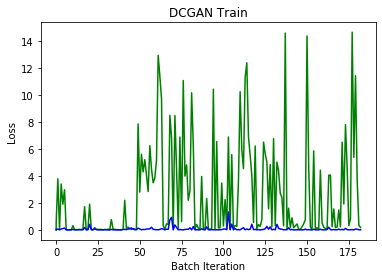

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


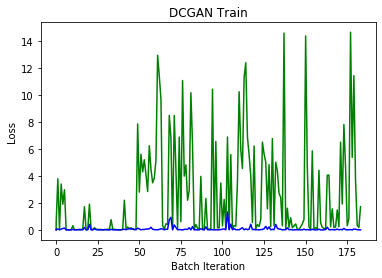

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


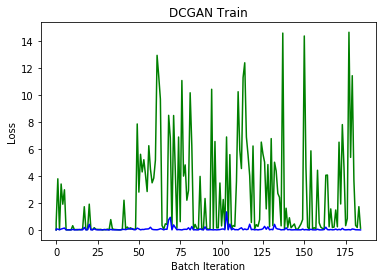

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


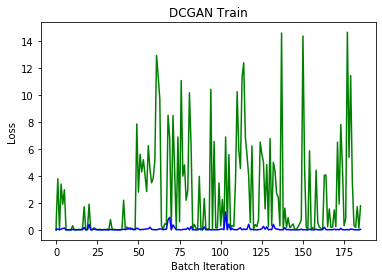

100%|██████████| 97/97 [00:53<00:00,  1.83it/s]


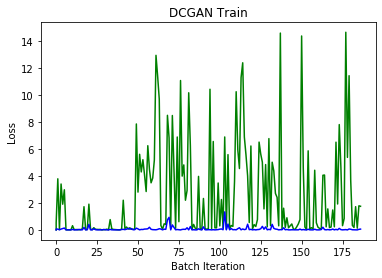

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


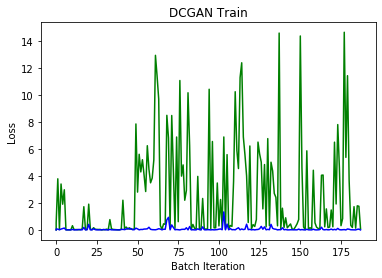

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


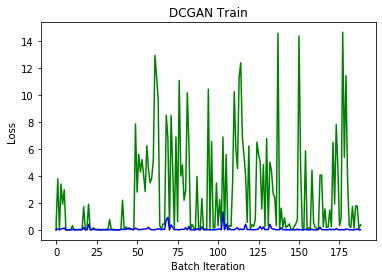

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


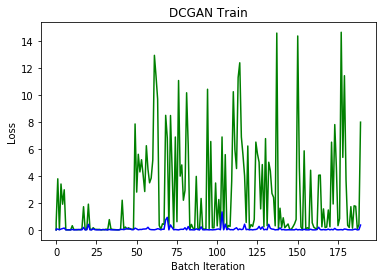

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


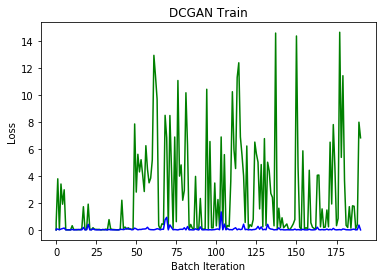

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


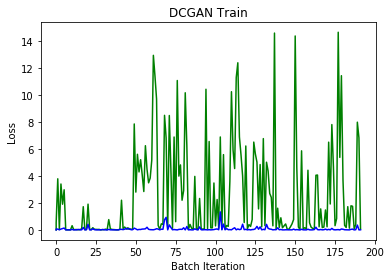

100%|██████████| 97/97 [00:53<00:00,  1.83it/s]


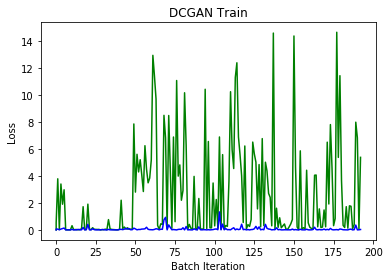

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


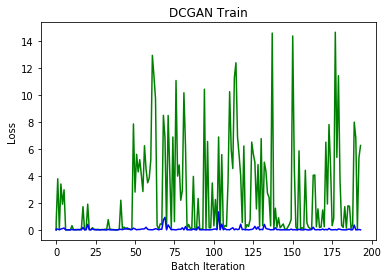

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


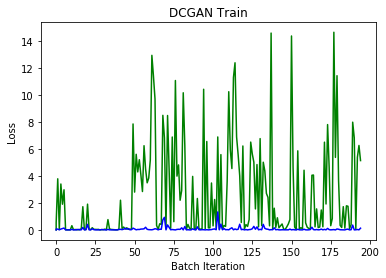

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


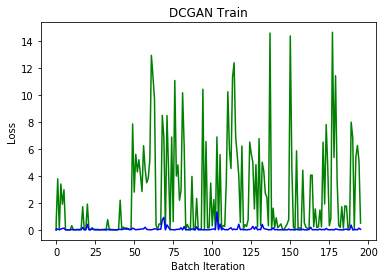

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


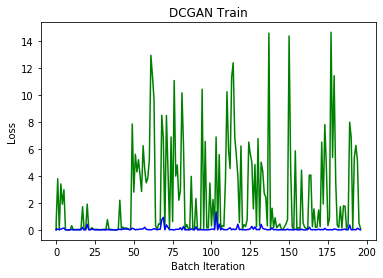

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


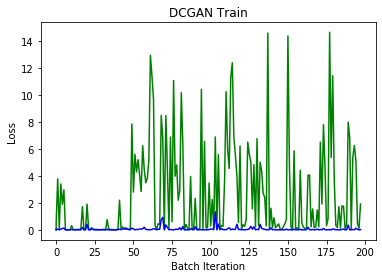

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


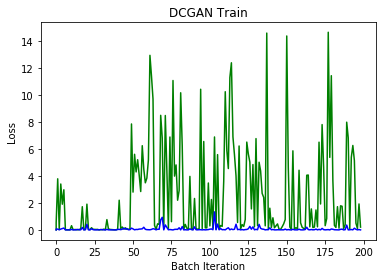

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


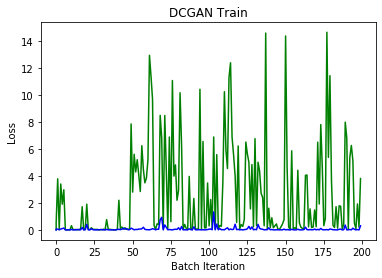

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


Epochs: 200/300 , D_Losses: 0.001 , G_Losses:  0.103


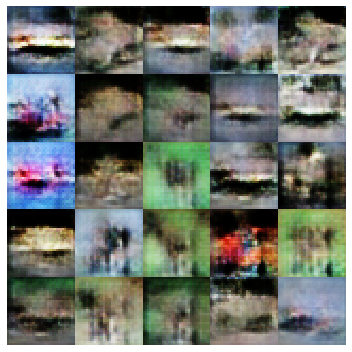

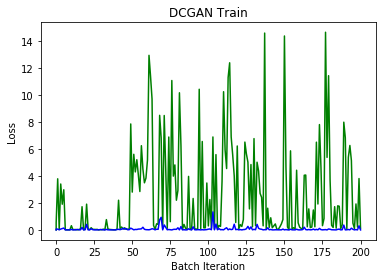

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


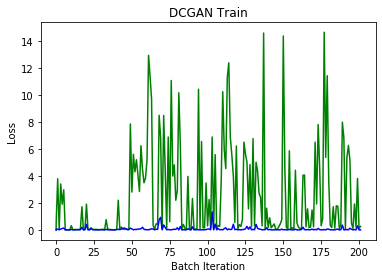

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


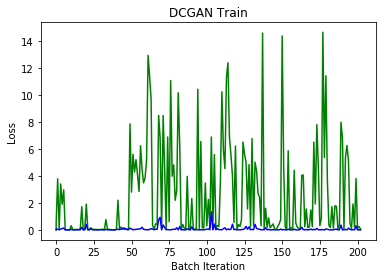

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


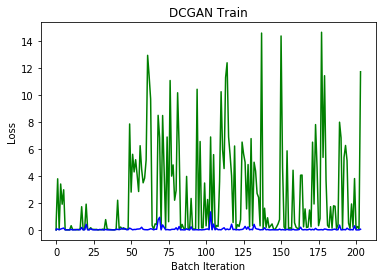

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


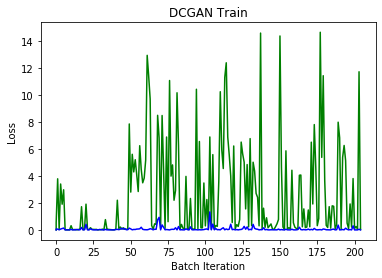

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


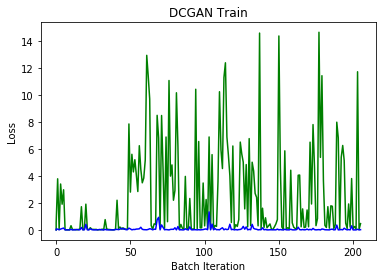

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


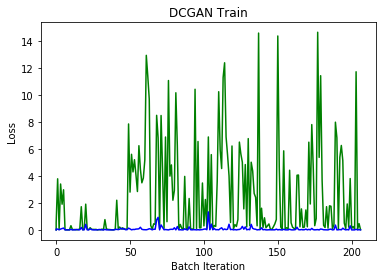

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


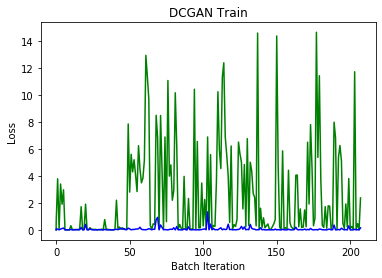

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


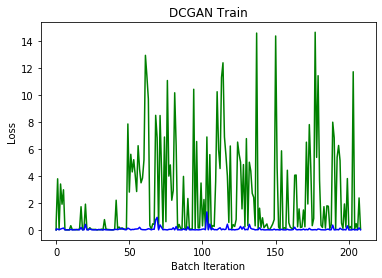

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


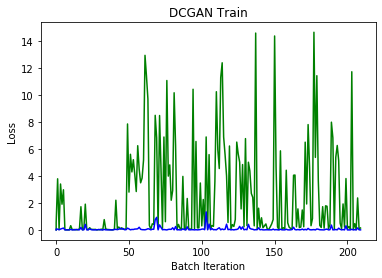

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


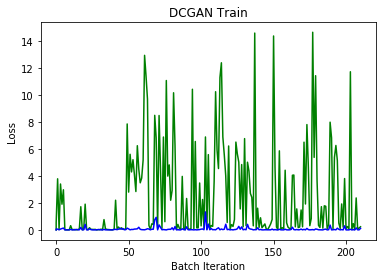

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


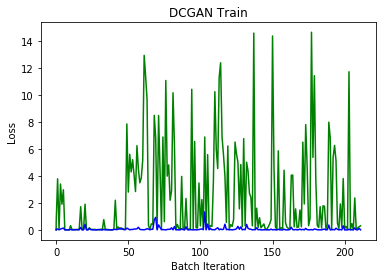

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


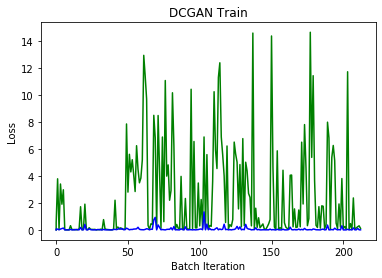

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


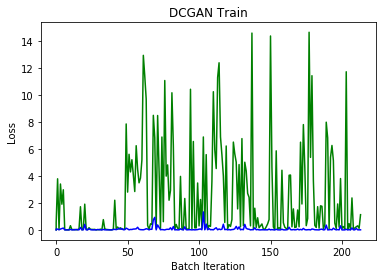

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


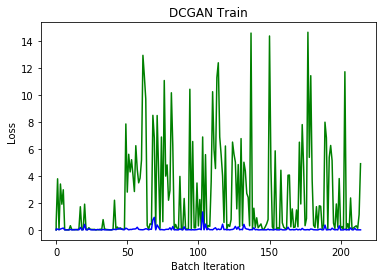

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


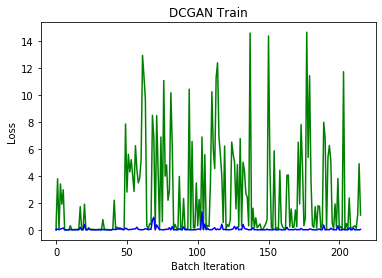

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


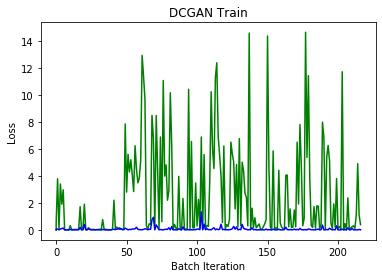

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


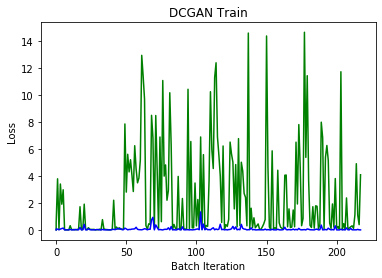

100%|██████████| 97/97 [00:53<00:00,  1.83it/s]


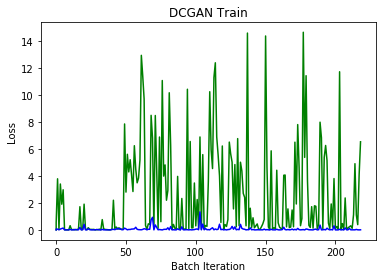

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


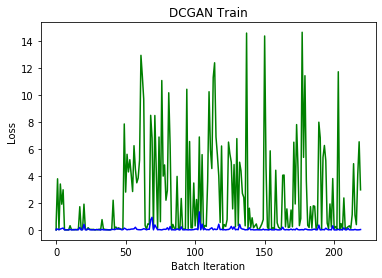

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


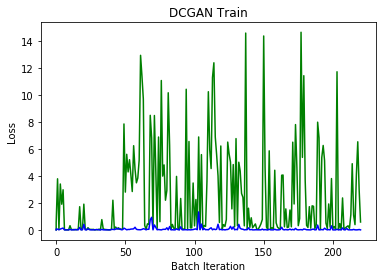

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


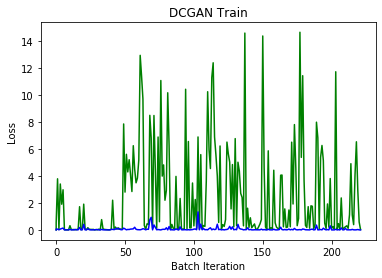

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


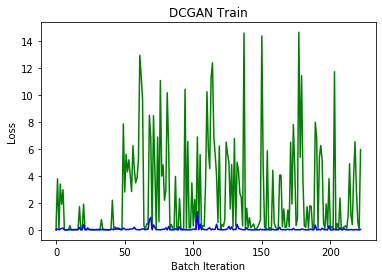

100%|██████████| 97/97 [00:53<00:00,  1.83it/s]


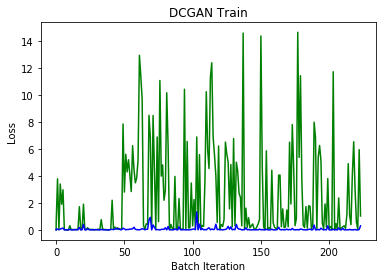

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


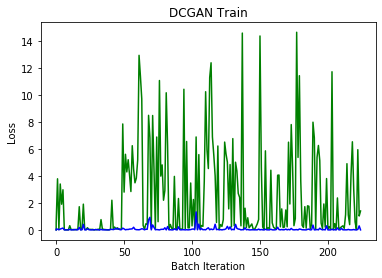

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


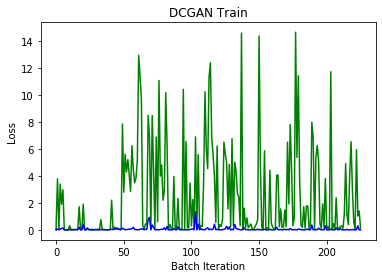

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


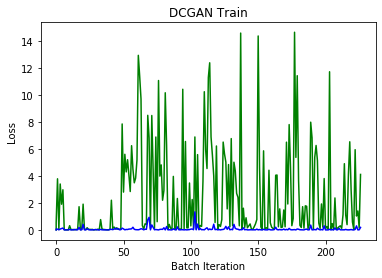

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


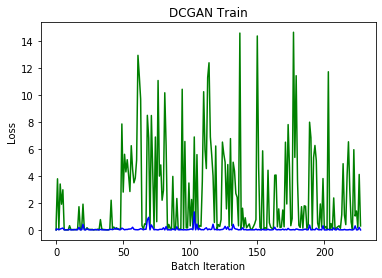

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


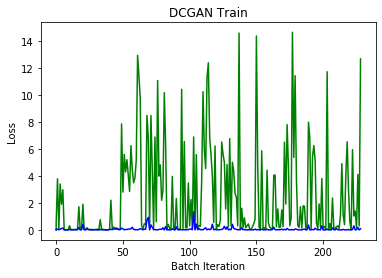

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


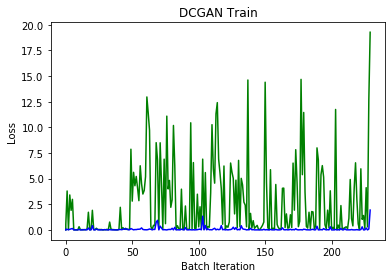

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


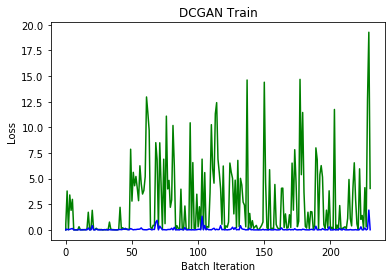

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


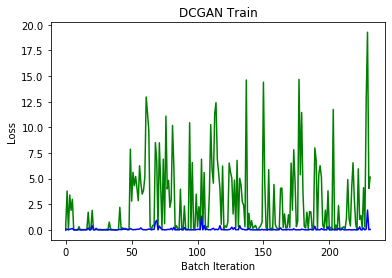

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


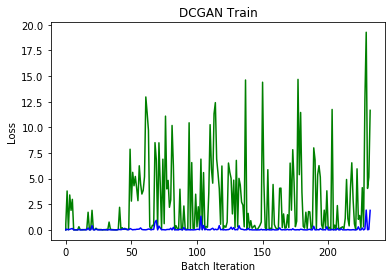

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


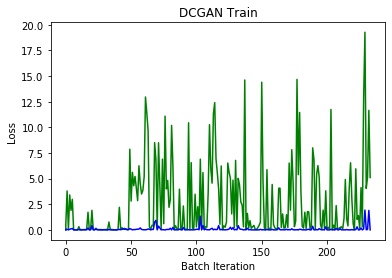

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


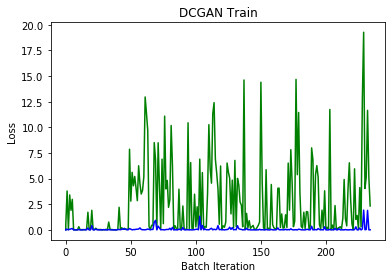

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


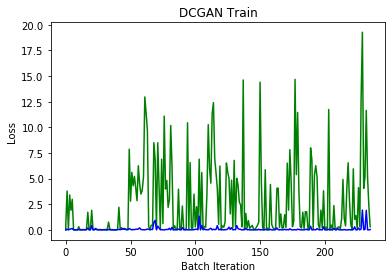

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


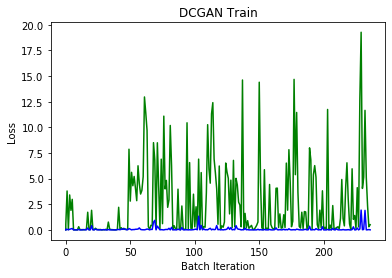

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


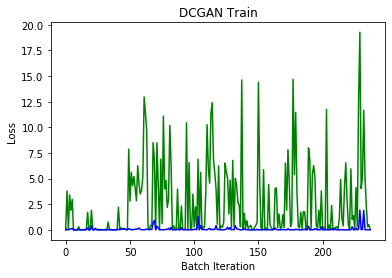

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


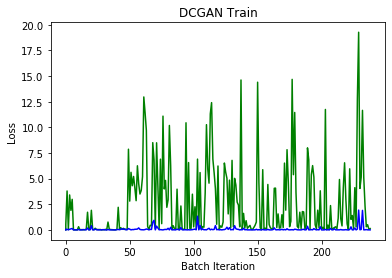

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


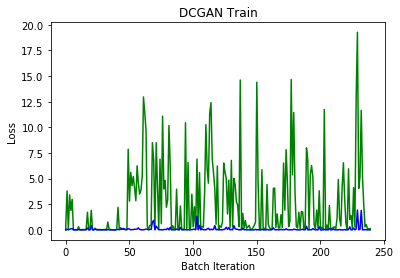

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


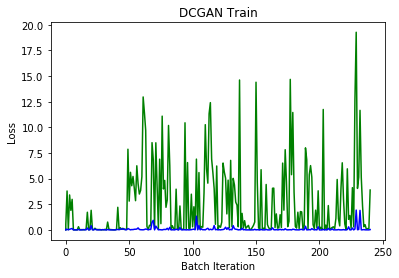

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


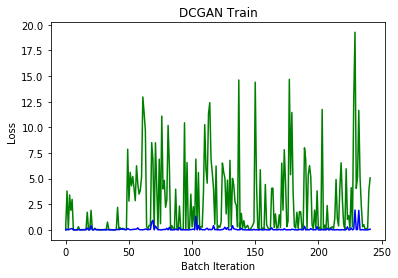

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


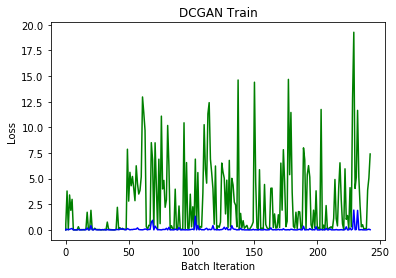

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


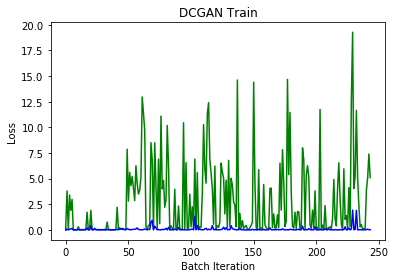

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


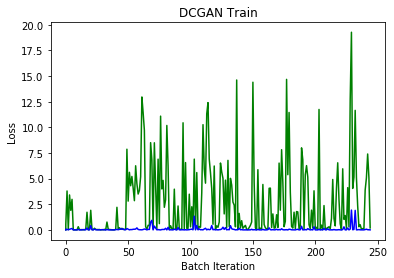

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


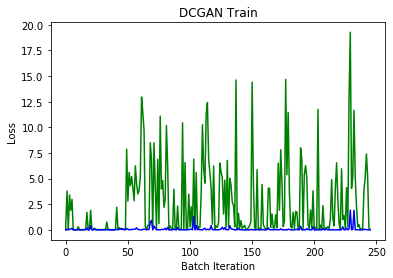

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


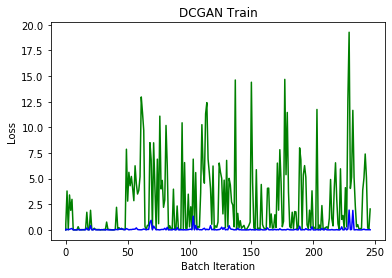

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


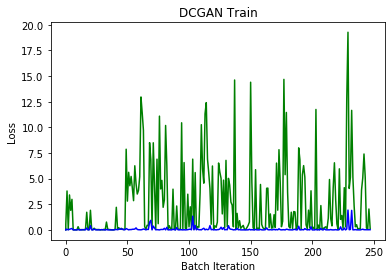

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


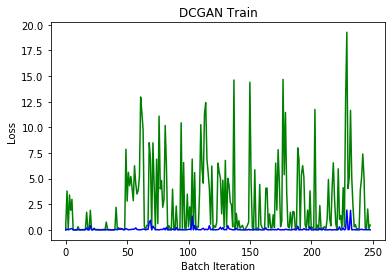

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


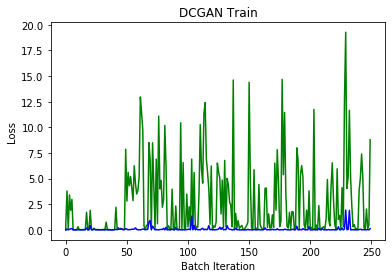

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


Epochs: 250/300 , D_Losses: 0.005 , G_Losses:  0.820


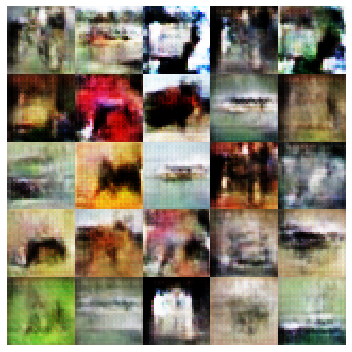

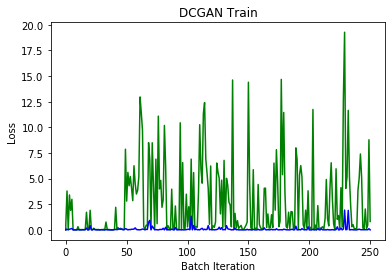

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


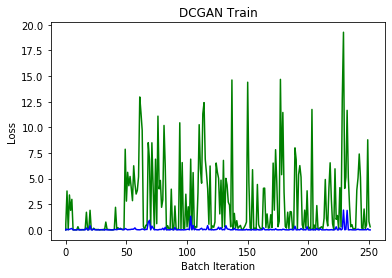

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


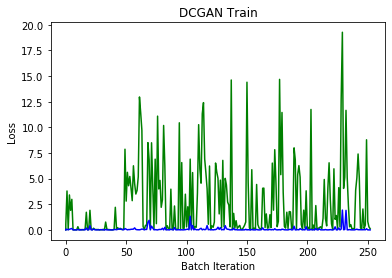

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


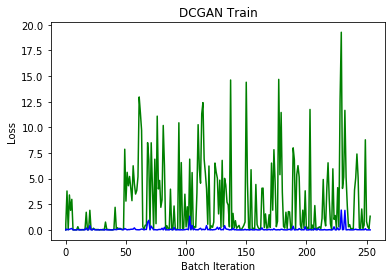

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


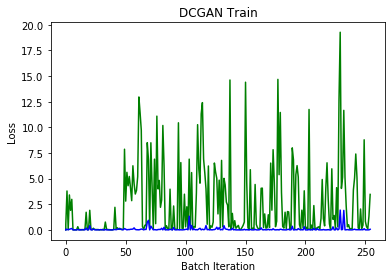

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


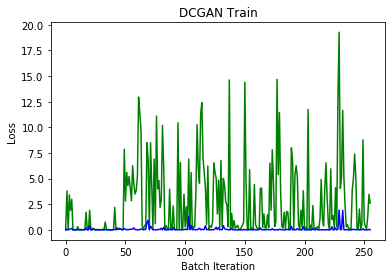

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


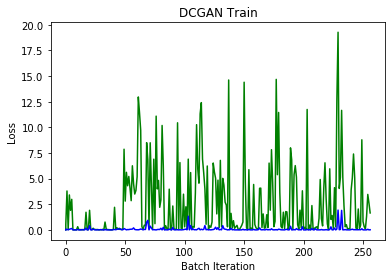

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


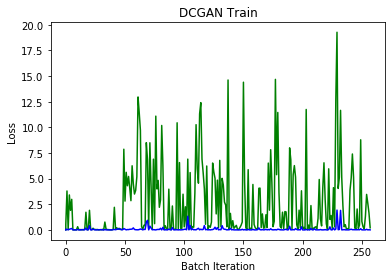

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


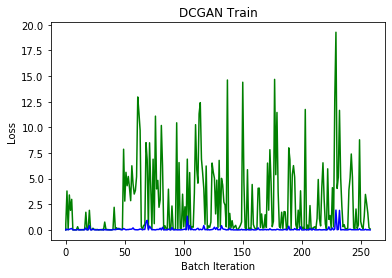

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


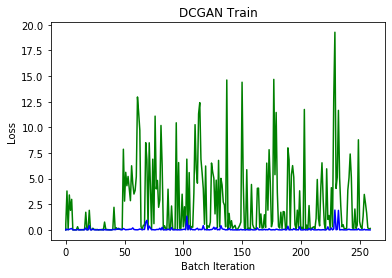

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


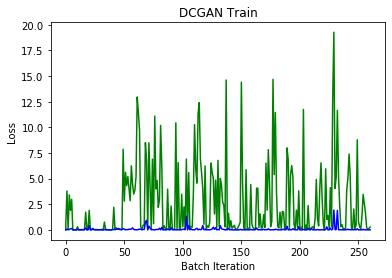

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


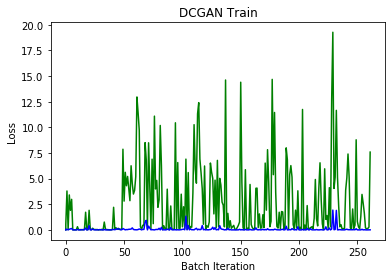

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


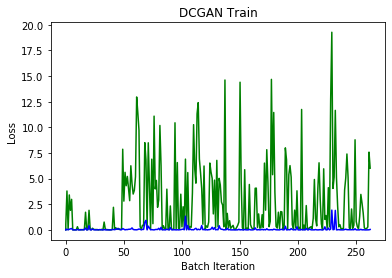

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


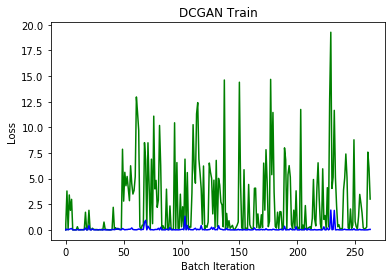

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


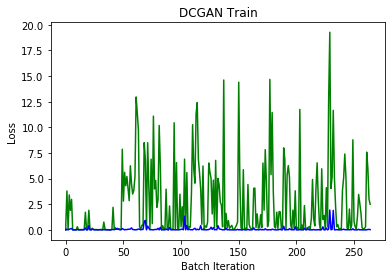

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


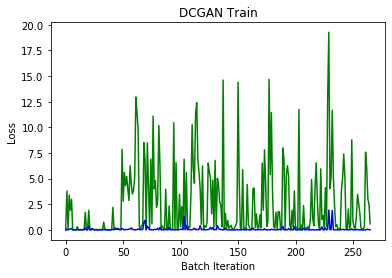

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


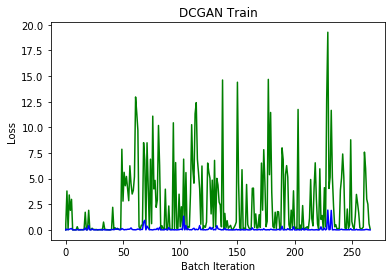

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


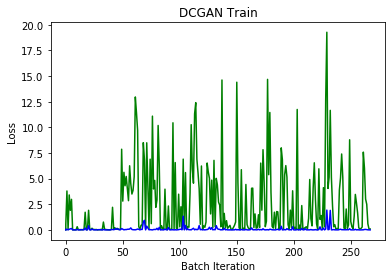

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


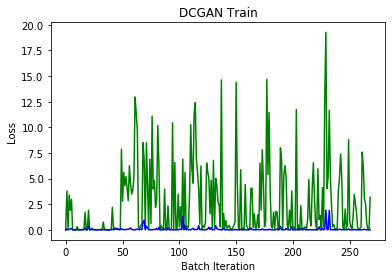

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


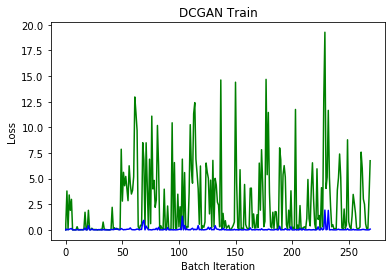

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


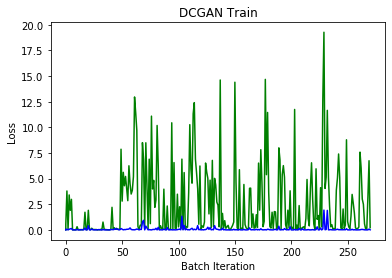

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


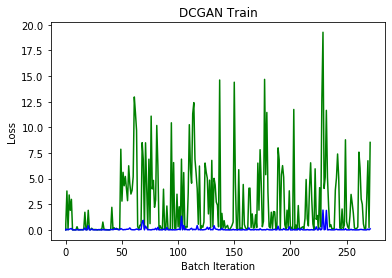

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


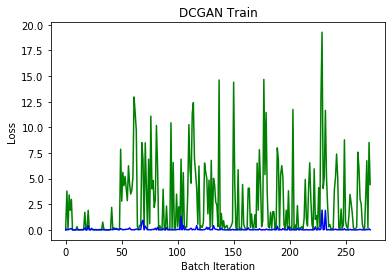

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


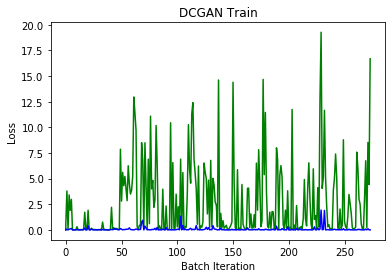

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


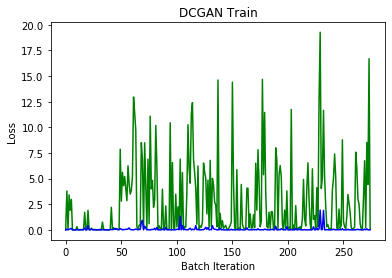

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


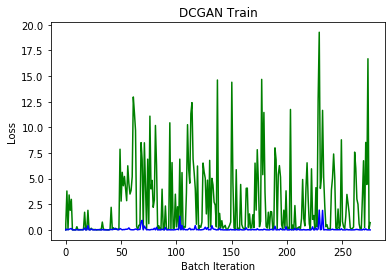

100%|██████████| 97/97 [00:53<00:00,  1.83it/s]


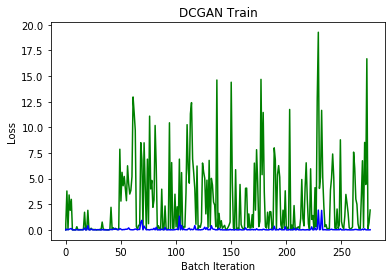

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


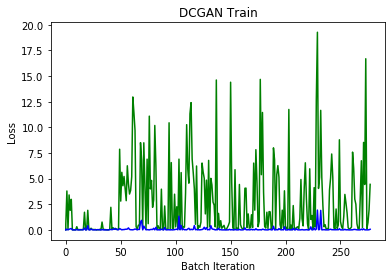

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


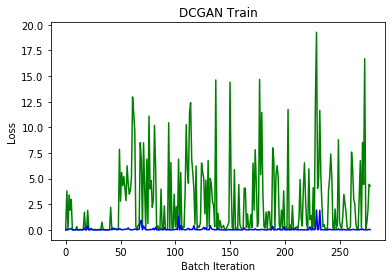

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


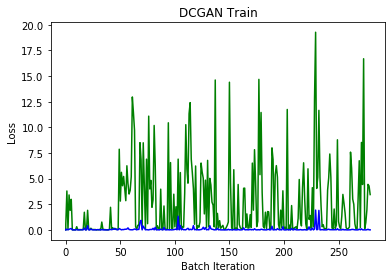

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


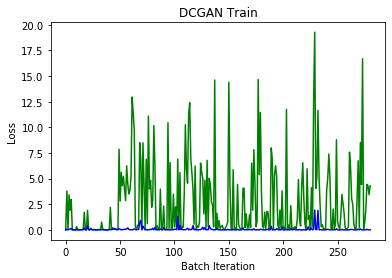

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


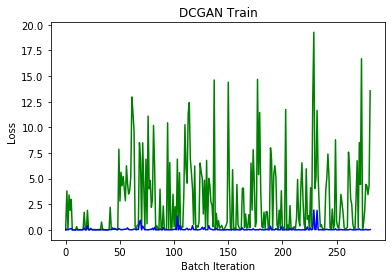

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


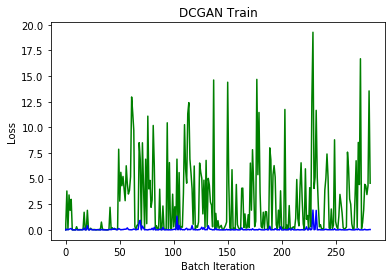

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


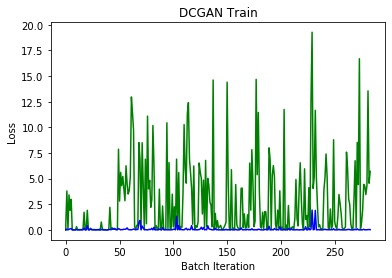

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


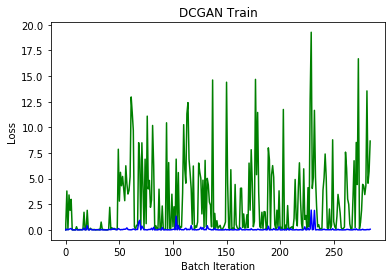

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


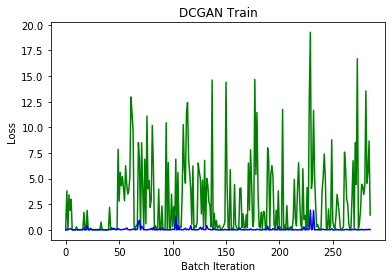

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


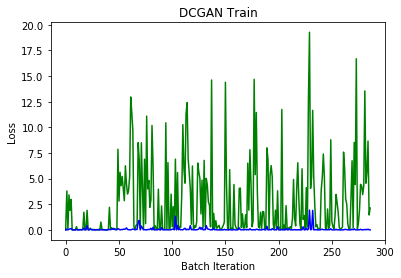

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


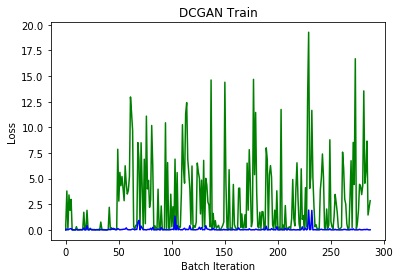

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


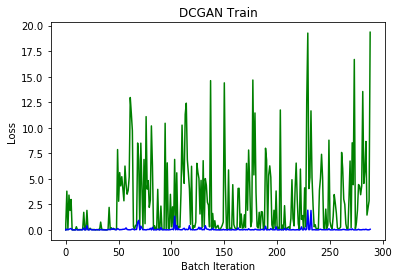

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


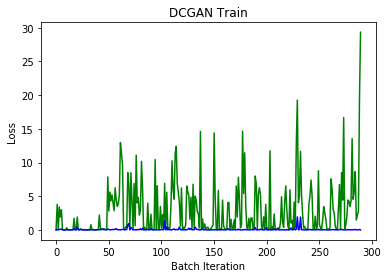

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


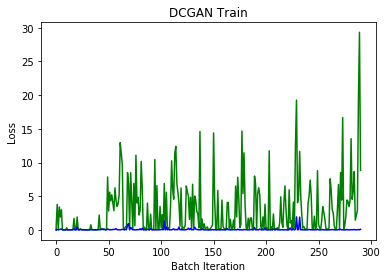

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


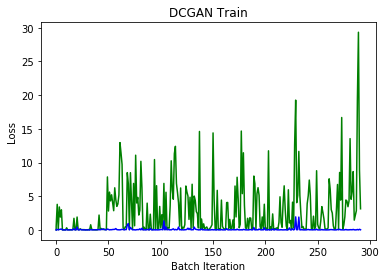

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


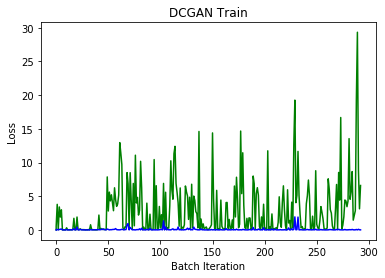

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


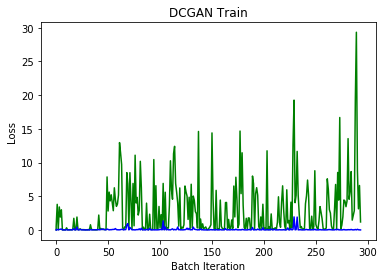

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


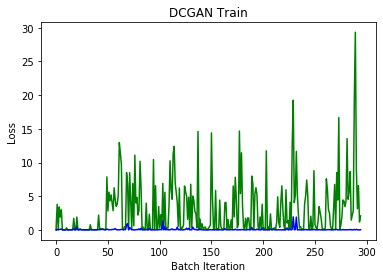

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


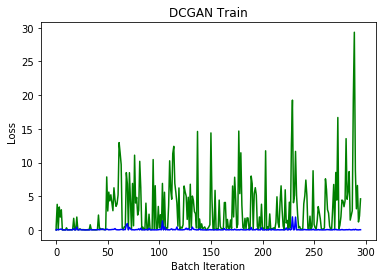

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


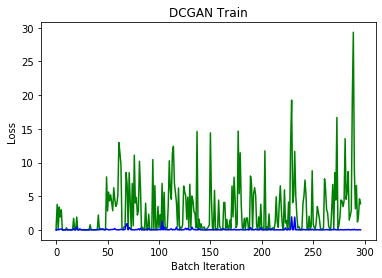

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


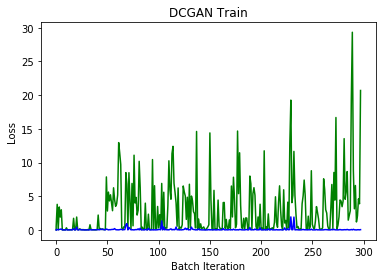

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


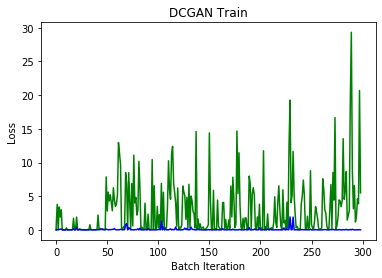

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


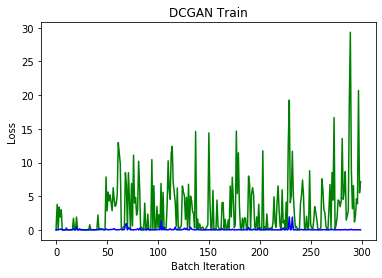

100%|██████████| 97/97 [00:53<00:00,  1.82it/s]


Epochs: 300/300 , D_Losses: 0.001 , G_Losses:  5.675


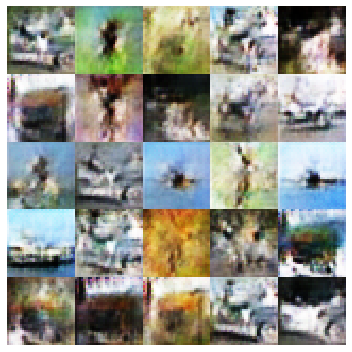

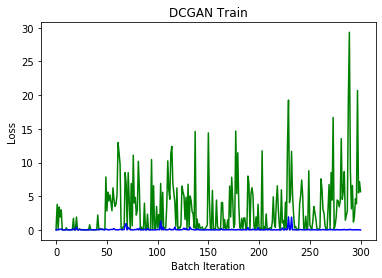

In [10]:
# Batch size during training
batch_size = 512
number_of_batches = train_images.shape[0]//batch_size

# Number of training epochs
num_epochs = 250

# Establish convention for real and fake labels during training
real_labels = np.ones(shape=(batch_size, 1)) # 1
fake_labels = np.zeros(shape=(batch_size, 1)) # 0

# Losses to keep track of
D_losses = np.empty(shape=1)
G_losses = np.empty(shape=1)
batches = np.empty(shape=1)
current_batch = 0

# config =tf.compat.v1.ConfigProto( device_count = {'GPU': 1} )
# sess = tf.compat.v1.Session(config=config) 
# tf.compat.v1.keras.backend.set_session(sess)

with tf.device('/GPU:0'):
    for epoch in range(num_epochs+1):
        for i in tqdm(range(number_of_batches)):

            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            discriminator.trainable=True

            # Calculate loss on all-real batch
            batch_images = train_images[i*batch_size : (i+1)*batch_size]
            real_loss = discriminator.train_on_batch(x=batch_images, y=real_labels)

            # Calculate loss on fake batch
            noise = np.random.normal(loc=0, scale=1, size=(batch_size, 100))
            fake_output = generator.predict_on_batch(noise)
            fake_loss = discriminator.train_on_batch(x = fake_output, y=fake_labels)

            # Discriminator loss
            d_loss_batch = real_loss + fake_loss

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            discriminator.trainable=False
            g_loss_batch = gan.train_on_batch(x = noise, y = real_labels)

        D_losses = np.append(D_losses, d_loss_batch[0])
        G_losses = np.append(G_losses, g_loss_batch[0])
        batches = np.append(batches, current_batch)
        current_batch += 1

        if epoch%50 == 0:
            print("Epochs: %d/%d , D_Losses: %.3f , G_Losses:  %.3f" % (epoch, num_epochs, D_losses[-1],G_losses[-1]))
            x_fake = generator.predict(np.random.normal(loc=0, scale=1, size=(25, 100)))
            plot_generated_images(x_fake, epoch)
            saveModels(epoch,discriminator,generator)

        # Each epoch update the loss graphs
        plt.figure(1)
        plt.plot(batches, G_losses, color='green', label='Generator Loss')
        plt.plot(batches, D_losses, color='blue', label='Discriminator Loss')
        plt.title("DCGAN Train")
        plt.xlabel("Batch Iteration")
        plt.ylabel("Loss")
        if epoch == 0:
            plt.legend()
        plt.pause(0.0000000001)
        plt.show()
        # plt.savefig('trainingLossPlot.png')


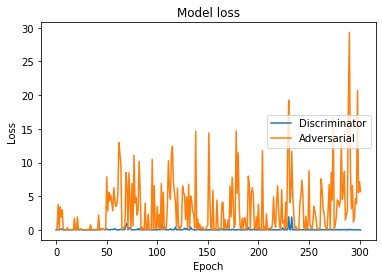

In [12]:
# plotting the metrics
plt.plot(D_losses)
plt.plot(G_losses)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Discriminator', 'Adversarial'], loc='center right')
plt.savefig('deep-learning-dcgan/save-plots/dcgan_%d_loss_epoch_dm.png' % epoch)

# Frechet Inception Distance (FID)

In [13]:
def scale_images(images, new_shape):
    images_list = list()
    for image in images:
        # resize with nearest neighbor interpolation
        new_image = resize(image, new_shape, 0)
        # store
        images_list.append(new_image) 
    return asarray(images_list)

# calculate frechet inception distance
def calculate_fid(model, images1, images2):
    # calculate activations
    act1 = model.predict(images1)
    act2 = model.predict(images2)

    # calculate mean and covariance stats
    mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)

    # calculate sum squared difference between means
    ssdiff = np.sum((mu1 - mu2)**2.0)
    # calculate sqrt of product between cov
    covmean = sqrtm(sigma1.dot(sigma2))

    # check and correct imaginary numbers from sqrt
    if iscomplexobj(covmean):
        covmean = covmean.real
    # calculate score
    fid = ssdiff + trace(sigma1 + sigma2 - 2.0*covmean)
    return fid

# prepare the inception v3 model
model = InceptionV3(include_top = False, pooling = 'avg', input_shape = (299, 299, 3))

# define two image sets
noise = np.random.normal(loc=0, scale=1, size=(1000, 100)) 
generated_output = generator.predict(noise)
test_images = test_images[0:1000]

# resize images
generated_test_images_scaled = scale_images(generated_output, (299, 299, 3))
test_images_scaled = scale_images(test_images, (299, 299, 3))

# FID between generated and test images
fid = calculate_fid(model, generated_test_images_scaled, test_images_scaled)

print('FID (same): %.3f' % fid)



FID (same): 154.817


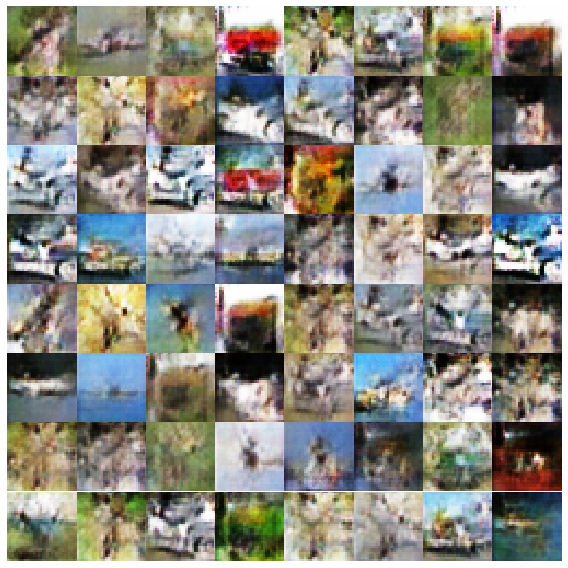

In [32]:
# plt.figure(figsize=(8,8), num=2)
# gs1 = gridspec.GridSpec(8,8)
# gs1.update(wspace = 0, hspace = 0)

# for i in range(64):
#     ax1 = plt.subplot(gs1[i])
#     ax1.set_aspect('equal')
#     image = test_images[i, :, :, :]
#     image += 1
#     image *= 127.5
#     fig = plt.imshow(image.astype(np.uint8))
#     plt.axis('off')
#     fig.axes.get_xaxis().set_visible(False)
#     fig.axes.get_yaxis().set_visible(False)
# #     plt.savefig('deep-learning/save-images/dcgan_generated_image_%d.png' % epoch)
# plt.tight_layout()
# plt.show()

In [41]:
from keras.models import load_model
generator.load_weights('deep-learning-dcgan/save-weights/dcgan_generator_epoch_300.h5')
noise = np.random.normal(loc=0, scale=1, size=(64, 100)) 
generated_output = generator.predict(noise)

plt.figure(figsize=(8,8), num=2)
gs1 = gridspec.GridSpec(8,8)
gs1.update(wspace = 0, hspace = 0)

for i in range(64):
    ax1 = plt.subplot(gs1[i])
    ax1.set_aspect('equal')
    image = generated_output[i, :, :, :]
    image += 1
    image *= 127.5
    fig = plt.imshow(image.astype(np.uint8))
    plt.axis('off')
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
#     plt.savefig('deep-learning/save-images/dcgan_generated_image_%d.png' % epoch)
plt.tight_layout()
plt.show()

ValueError: Error when checking input: expected conv2d_1_input to have 4 dimensions, but got array with shape (64, 100)

In [38]:
from skimage.transform import rescale, resize, downscale_local_mean
image_downscaled = downscale_local_mean(test_images[1:1000])

TypeError: downscale_local_mean() missing 1 required positional argument: 'factors'